In [12]:
import pandas as pd
import numpy as np
import seaborn
import matplotlib
import statistics
from sklearn.decomposition import PCA
from sklearn.decomposition import KernelPCA
from sklearn.manifold import TSNE
from sklearn.manifold import MDS
from sklearn.impute import SimpleImputer
from sklearn.preprocessing import StandardScaler
import math
import glob
from itertools import combinations
from matplotlib import pyplot as plt
from Bio import Phylo
import biotite
from pca_plot import *
from vst_function import *
from stattools.resampling import PermutationTest
from scipy import stats
from pyranges import PyRanges
import seaborn as sns

In [13]:
## Read and merge files 
anotation = pd.read_csv('../data/SGDP_anotation.csv', sep=',', encoding='latin-1')

ids_hg19 = pd.DataFrame()
ids_hg19['Sample'] = anotation['3-Illumina_ID']
ids_hg19['Region'] = anotation['10-Region']


In [14]:
def read_file(file):
    """
    Read a file to a dict of lists.

    :param str file: Path to a sample file.
    :return: dict of lists of records
    :rtype: dict
    """
    vcf_dict = []
    #df = pd.DataFrame()
    with open(file, 'r') as invcf:
        for line in invcf:
            if line.startswith('track'):
                continue
                
    
    
            line = line.strip().split()
            CHR = line[0]
            START = line[1]
            END = line[2]
            SCORE = line[3]
            name = str(file.split('/')[-1]) 
            
            if SCORE == '2':
                continue
            
            vcf_dict.append([name, CHR, START,END, SCORE])
            
            
    return vcf_dict



def read_multiple_files(path_of_files):
    """
    Read the path of vcf files to a dataframe.
    :param str file: Path to a files.
    :return: dict of lists of  records
    :rtype: dict
    """
    files = glob.glob(path_of_files+'*')
    chm13list = []
    for file in files:
        #return pd.DataFrame(read_vcf(file))
        chm13list.append(read_file(file))
    
    return (chm13list)


df = read_multiple_files('../data/CHM13_SGDP/')


In [15]:
Output = []
  
# Using iteration
for temp in df:
    for elem in temp:
        Output.append(elem)


In [16]:
chm13 = pd.DataFrame(Output)

chm13.columns = ['Sample', 'Chromosome', 'Start', 'End', 'Score']
chm13['Start'] = chm13['Start'].astype(int)
chm13['End'] = chm13['End'].astype(int)
chm13['Score'] = chm13['Score'].astype(int)

#chm13.to_csv('t2tchm13_cnvs.csv')
## Keeping only samples that are on old cnvs 
chm13 = chm13.merge(ids_hg19, on=['Sample'])


chm13


,Sample,Chromosome,Start,End,Score,Region
0,LP6005442-DNA_A11,CP068254.1,0,1000,836,WestEurasia
1,LP6005442-DNA_A11,CP068254.1,1000,2228,884,WestEurasia
2,LP6005442-DNA_A11,CP068254.1,2228,3378,798,WestEurasia
3,LP6005442-DNA_A11,CP068254.1,3378,4522,811,WestEurasia
4,LP6005442-DNA_A11,CP068254.1,4522,5522,905,WestEurasia
...,...,...,...,...,...,...
35659700,LP6005441-DNA_B09,CP086569.2,62447554,62448825,25,EastAsia
35659701,LP6005441-DNA_B09,CP086569.2,62448825,62449825,27,EastAsia
35659702,LP6005441-DNA_B09,CP086569.2,62449825,62450825,29,EastAsia
35659703,LP6005441-DNA_B09,CP086569.2,62450825,62451825,27,EastAsia


In [17]:
#REMOVE SAMPLES WITH ABERRATIONS
samples_with_aberrations = ['LP6005441-DNA_B03', ' LP6005443-DNA_G01', 'LP6005441-DNA_G09', 'LP6005441-DNA_D04'] 

chm13 = chm13[~chm13.Sample.isin(samples_with_aberrations)]


chm13#.value_counts(by=["Sample_ID"])
#chm13.columns = ['Chromosome', 'Start', 'End', 'CNVR_ID', 'Sample', 'CNV_start', 'CNV_end', 'Score', 'Length']
chm13

,Sample,Chromosome,Start,End,Score,Region
0,LP6005442-DNA_A11,CP068254.1,0,1000,836,WestEurasia
1,LP6005442-DNA_A11,CP068254.1,1000,2228,884,WestEurasia
2,LP6005442-DNA_A11,CP068254.1,2228,3378,798,WestEurasia
3,LP6005442-DNA_A11,CP068254.1,3378,4522,811,WestEurasia
4,LP6005442-DNA_A11,CP068254.1,4522,5522,905,WestEurasia
...,...,...,...,...,...,...
35659700,LP6005441-DNA_B09,CP086569.2,62447554,62448825,25,EastAsia
35659701,LP6005441-DNA_B09,CP086569.2,62448825,62449825,27,EastAsia
35659702,LP6005441-DNA_B09,CP086569.2,62449825,62450825,29,EastAsia
35659703,LP6005441-DNA_B09,CP086569.2,62450825,62451825,27,EastAsia


In [18]:
## ADDING DUPLICATION/DELETION COLUMN 
deletions = chm13[chm13['Score'] < 2 ] 
deletions['Type'] = 'deletion'
duplications= chm13[chm13['Score'] > 2] 
duplications['Type'] = 'duplication'

frames = [deletions,duplications]

chm13 = pd.concat(frames)
chm13

/var/folders/05/4pfxtbrs5459ytz3j1jhcgt00000gn/T/ipykernel_1285/4150614961.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  deletions['Type'] = 'deletion'
/var/folders/05/4pfxtbrs5459ytz3j1jhcgt00000gn/T/ipykernel_1285/4150614961.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  duplications['Type'] = 'duplication'


,Sample,Chromosome,Start,End,Score,Region,Type
17,LP6005442-DNA_A11,CP068255.2,79662,98643,1,WestEurasia,deletion
18,LP6005442-DNA_A11,CP068255.2,105118,116978,1,WestEurasia,deletion
20,LP6005442-DNA_A11,CP068255.2,158982,162403,1,WestEurasia,deletion
24,LP6005442-DNA_A11,CP068255.2,169811,172183,1,WestEurasia,deletion
25,LP6005442-DNA_A11,CP068255.2,176466,178147,1,WestEurasia,deletion
...,...,...,...,...,...,...,...
35659700,LP6005441-DNA_B09,CP086569.2,62447554,62448825,25,EastAsia,duplication
35659701,LP6005441-DNA_B09,CP086569.2,62448825,62449825,27,EastAsia,duplication
35659702,LP6005441-DNA_B09,CP086569.2,62449825,62450825,29,EastAsia,duplication
35659703,LP6005441-DNA_B09,CP086569.2,62450825,62451825,27,EastAsia,duplication


In [19]:
### Getting gene anotation to filtering 
header_list = ['Chromosome','Start', 'End', 'Name', 'Score', 'Strand', 'End-2', 'End-3', 'TYPE_CODE','BLOCKS', 'Lenght', 'NORELATIVE'] 
gene_anotation = pd.read_table('../data/gene_anotation_chm13', names = header_list)
#gene_anotation = gene_anotation[gene_anotation['TYPE']=='76,85,212'] # only selecting protein-coding genes

feature_table = pd.read_table('../data/GCF_009914755.1_T2T-CHM13v2.0_feature_table.txt')#, index_col='chr

report = pd.read_table('../data/GCF_009914755.1_T2T-CHM13v2.0_assembly_report.txt')

chm13_gene_anotation = feature_table.merge(report, left_on='genomic_accession', right_on='RefSeq-Accn')
chm13_gene_anotation = chm13_gene_anotation[chm13_gene_anotation['class'] == 'protein_coding']
chm13_gene_anotation

/var/folders/05/4pfxtbrs5459ytz3j1jhcgt00000gn/T/ipykernel_1285/1985960472.py:6: DtypeWarning: Columns (5) have mixed types. Specify dtype option on import or set low_memory=False.
  feature_table = pd.read_table('../data/GCF_009914755.1_T2T-CHM13v2.0_feature_table.txt')#, index_col='chr


,# feature,class,assembly,assembly_unit,seq_type,chromosome,genomic_accession,start,end,strand,...,Sequence-Name,Sequence-Role,Assigned-Molecule,Assigned-Molecule-Location/Type,GenBank-Accn,Relationship,RefSeq-Accn,Assembly-Unit,Sequence-Length,UCSC-style-name
0,gene,protein_coding,GCF_009914755.1,Primary Assembly,chromosome,1,NC_060925.1,11134,37628,-,...,1,assembled-molecule,1,Chromosome,CP068277.2,=,NC_060925.1,Primary Assembly,248387328,na
7,gene,protein_coding,GCF_009914755.1,Primary Assembly,chromosome,1,NC_060925.1,111940,112877,-,...,1,assembled-molecule,1,Chromosome,CP068277.2,=,NC_060925.1,Primary Assembly,248387328,na
42,gene,protein_coding,GCF_009914755.1,Primary Assembly,chromosome,1,NC_060925.1,353566,373316,+,...,1,assembled-molecule,1,Chromosome,CP068277.2,=,NC_060925.1,Primary Assembly,248387328,na
49,gene,protein_coding,GCF_009914755.1,Primary Assembly,chromosome,1,NC_060925.1,372945,388041,-,...,1,assembled-molecule,1,Chromosome,CP068277.2,=,NC_060925.1,Primary Assembly,248387328,na
52,gene,protein_coding,GCF_009914755.1,Primary Assembly,chromosome,1,NC_060925.1,389374,394430,+,...,1,assembled-molecule,1,Chromosome,CP068277.2,=,NC_060925.1,Primary Assembly,248387328,na
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
232256,gene,protein_coding,GCF_009914755.1,Primary Assembly,chromosome,Y,NC_060948.1,36480752,36497801,+,...,Y,assembled-molecule,Y,Chromosome,CP086569.2,=,NC_060948.1,Primary Assembly,62460029,na
236280,gene,protein_coding,GCF_009914755.1,Primary Assembly,chromosome,Y,NC_060948.1,62190003,62204700,+,...,Y,assembled-molecule,Y,Chromosome,CP086569.2,=,NC_060948.1,Primary Assembly,62460029,na
236288,gene,protein_coding,GCF_009914755.1,Primary Assembly,chromosome,Y,NC_060948.1,62306325,62368760,+,...,Y,assembled-molecule,Y,Chromosome,CP086569.2,=,NC_060948.1,Primary Assembly,62460029,na
236300,gene,protein_coding,GCF_009914755.1,Primary Assembly,chromosome,Y,NC_060948.1,62422687,62435805,+,...,Y,assembled-molecule,Y,Chromosome,CP086569.2,=,NC_060948.1,Primary Assembly,62460029,na


In [20]:
gene_coordinates = pd.DataFrame()
gene_coordinates['Chromosome'] = chm13_gene_anotation['chromosome'] 
gene_coordinates['Start'] = chm13_gene_anotation['start']
gene_coordinates['End'] = chm13_gene_anotation['end']

In [21]:
#chm13 = pd.read_csv('../data/chm13_gene_regions.csv', index_col=0)
chm13['Lenght'] = chm13['End'] - chm13['Start']
chm13

chm13 = chm13[chm13['Lenght'] < 2000000]
chm13

,Sample,Chromosome,Start,End,Score,Region,Type,Lenght
17,LP6005442-DNA_A11,CP068255.2,79662,98643,1,WestEurasia,deletion,18981
18,LP6005442-DNA_A11,CP068255.2,105118,116978,1,WestEurasia,deletion,11860
20,LP6005442-DNA_A11,CP068255.2,158982,162403,1,WestEurasia,deletion,3421
24,LP6005442-DNA_A11,CP068255.2,169811,172183,1,WestEurasia,deletion,2372
25,LP6005442-DNA_A11,CP068255.2,176466,178147,1,WestEurasia,deletion,1681
...,...,...,...,...,...,...,...,...
35659700,LP6005441-DNA_B09,CP086569.2,62447554,62448825,25,EastAsia,duplication,1271
35659701,LP6005441-DNA_B09,CP086569.2,62448825,62449825,27,EastAsia,duplication,1000
35659702,LP6005441-DNA_B09,CP086569.2,62449825,62450825,29,EastAsia,duplication,1000
35659703,LP6005441-DNA_B09,CP086569.2,62450825,62451825,27,EastAsia,duplication,1000


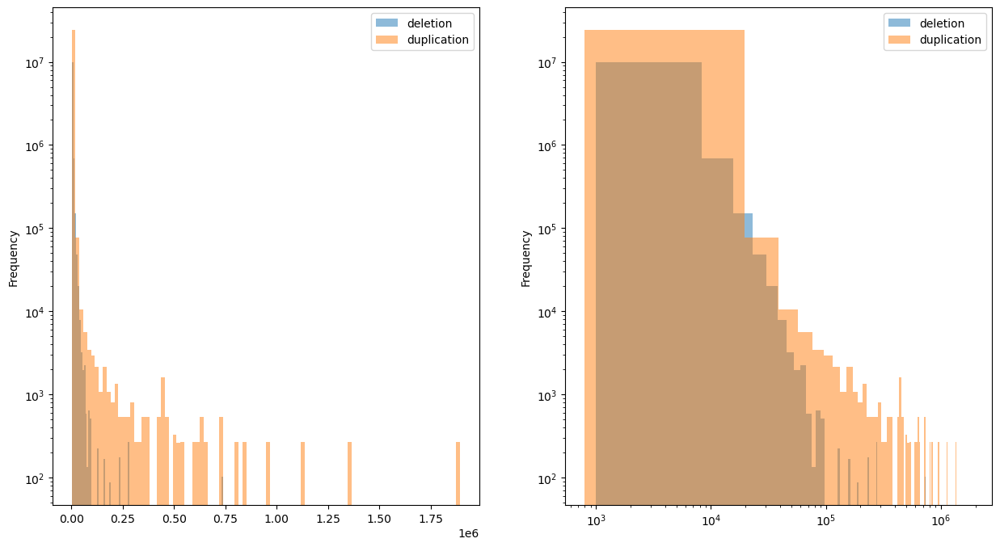

In [22]:
fig, axs = plt.subplots(1, 2, figsize=(15, 8))

df_plot= chm13.groupby(['Type'])['Lenght']

df_plot.plot(kind='hist',stacked=True, bins=100, legend=True, ax=axs[0], log=True, alpha=0.5) # alpha for transparency

plt.xscale('log')
#plt.show()

df_plot = chm13.groupby(['Type'])['Lenght']

df_plot.plot(kind='hist',stacked=True, bins=100, legend=True, ax=axs[1], log=True, alpha=0.5) # alpha for transparency

plt.show()

In [23]:
chm13['Lenght'].describe()

count    3.525298e+07
mean     3.125766e+03
std      1.204405e+04
min      7.910000e+02
25%      1.172000e+03
50%      1.746000e+03
75%      3.106000e+03
max      1.893777e+06
Name: Lenght, dtype: float64

In [24]:
## Replacing chromosome names 
dict_chr = dict(zip(report['GenBank-Accn'], report['Assigned-Molecule']))
dict_chr#[final_cnv['Chromosome']== 'CP068254.1']

{'CP068277.2': '1',
 'CP068276.2': '2',
 'CP068275.2': '3',
 'CP068274.2': '4',
 'CP068273.2': '5',
 'CP068272.2': '6',
 'CP068271.2': '7',
 'CP068270.2': '8',
 'CP068269.2': '9',
 'CP068268.2': '10',
 'CP068267.2': '11',
 'CP068266.2': '12',
 'CP068265.2': '13',
 'CP068264.2': '14',
 'CP068263.2': '15',
 'CP068262.2': '16',
 'CP068261.2': '17',
 'CP068260.2': '18',
 'CP068259.2': '19',
 'CP068258.2': '20',
 'CP068257.2': '21',
 'CP068256.2': '22',
 'CP068255.2': 'X',
 'CP086569.2': 'Y',
 'CP068254.1': 'MT'}

In [25]:
#subsetting deletions and duplications
#deletions = chm13[chm13['Type'] =='deletion']
#duplications = chm13[chm13['Type'] == 'duplication']
#deletions

In [26]:
#change to df when using telomeres and centromeres filtration
final_cnv = chm13.pivot_table(index=["Chromosome", "Start", "End"], 
                    columns='Sample', 
                    values='Score',
                        fill_value=2).reset_index()


final_cnv

Sample,Chromosome,Start,End,LP6005441-DNA_A01,LP6005441-DNA_A03,LP6005441-DNA_A04,LP6005441-DNA_A05,LP6005441-DNA_A06,LP6005441-DNA_A08,LP6005441-DNA_A09,...,LP6005677-DNA_D03,LP6005677-DNA_E01,LP6005677-DNA_F01,LP6005677-DNA_G01,LP6007068-DNA_A01,LP6007069-DNA_A01,SS6004471,SS6004477,SS6004478,SS6004480
0,CP068254.1,0,1000,755.0,729.0,817.0,921.0,947.0,792.0,695.0,...,91.0,728.0,847.0,217.0,171.0,217.0,725.0,731.0,1022.0,227.0
1,CP068254.1,1000,2228,778.0,741.0,836.0,946.0,989.0,814.0,717.0,...,93.0,759.0,879.0,226.0,179.0,223.0,773.0,754.0,1135.0,243.0
2,CP068254.1,2228,3378,703.0,704.0,780.0,885.0,936.0,765.0,670.0,...,82.0,696.0,829.0,205.0,155.0,197.0,708.0,684.0,1024.0,221.0
3,CP068254.1,3378,4522,724.0,706.0,799.0,898.0,945.0,784.0,687.0,...,85.0,735.0,845.0,214.0,168.0,211.0,735.0,709.0,1085.0,228.0
4,CP068254.1,4522,5522,795.0,762.0,868.0,972.0,1025.0,838.0,742.0,...,90.0,766.0,901.0,219.0,177.0,225.0,791.0,766.0,1182.0,241.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1012811,CP086569.2,62447554,62448825,18.0,24.0,22.0,22.0,19.0,23.0,25.0,...,25.0,17.0,21.0,24.0,24.0,23.0,19.0,21.0,22.0,23.0
1012812,CP086569.2,62448825,62449825,19.0,25.0,22.0,24.0,21.0,25.0,27.0,...,25.0,19.0,22.0,25.0,24.0,23.0,19.0,22.0,22.0,24.0
1012813,CP086569.2,62449825,62450825,21.0,27.0,24.0,26.0,21.0,25.0,29.0,...,27.0,20.0,24.0,26.0,27.0,27.0,23.0,26.0,26.0,26.0
1012814,CP086569.2,62450825,62451825,20.0,26.0,23.0,25.0,21.0,24.0,27.0,...,26.0,19.0,22.0,25.0,28.0,28.0,22.0,27.0,26.0,28.0


In [27]:
final_cnv['Chromosome'] =  final_cnv['Chromosome'].replace(dict_chr)
final_cnv = final_cnv[~final_cnv['Chromosome'].isin(['MT', 'X', 'Y'])]


final_cnv

Sample,Chromosome,Start,End,LP6005441-DNA_A01,LP6005441-DNA_A03,LP6005441-DNA_A04,LP6005441-DNA_A05,LP6005441-DNA_A06,LP6005441-DNA_A08,LP6005441-DNA_A09,...,LP6005677-DNA_D03,LP6005677-DNA_E01,LP6005677-DNA_F01,LP6005677-DNA_G01,LP6007068-DNA_A01,LP6007069-DNA_A01,SS6004471,SS6004477,SS6004478,SS6004480
47804,22,0,20541,28.0,30.0,32.0,35.0,32.0,29.0,33.0,...,30.0,33.0,33.0,37.0,34.0,38.0,30.0,32.0,33.0,32.0
47805,22,20541,22327,28.0,31.0,32.0,35.0,32.0,28.0,32.0,...,30.0,33.0,34.0,35.0,34.0,38.0,31.0,32.0,33.0,34.0
47806,22,22327,23327,26.0,29.0,31.0,32.0,29.0,26.0,31.0,...,27.0,29.0,30.0,31.0,30.0,32.0,24.0,28.0,28.0,30.0
47807,22,23327,25569,20.0,21.0,23.0,25.0,23.0,20.0,24.0,...,21.0,22.0,23.0,24.0,22.0,24.0,18.0,21.0,21.0,22.0
47808,22,25569,26687,13.0,13.0,15.0,17.0,14.0,13.0,15.0,...,14.0,14.0,14.0,14.0,14.0,15.0,10.0,13.0,14.0,14.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1004612,1,248364795,248366351,23.0,26.0,27.0,29.0,26.0,23.0,28.0,...,25.0,25.0,26.0,28.0,28.0,32.0,25.0,26.0,28.0,28.0
1004613,1,248366351,248367622,27.0,31.0,29.0,29.0,29.0,27.0,28.0,...,28.0,28.0,26.0,33.0,31.0,31.0,29.0,24.0,26.0,33.0
1004614,1,248367622,248368745,23.0,27.0,27.0,29.0,26.0,24.0,27.0,...,25.0,25.0,27.0,29.0,26.0,28.0,24.0,23.0,25.0,30.0
1004615,1,248368745,248370339,35.0,41.0,39.0,43.0,41.0,37.0,40.0,...,39.0,42.0,41.0,48.0,42.0,45.0,39.0,37.0,39.0,42.0


In [28]:
final_cnv

Sample,Chromosome,Start,End,LP6005441-DNA_A01,LP6005441-DNA_A03,LP6005441-DNA_A04,LP6005441-DNA_A05,LP6005441-DNA_A06,LP6005441-DNA_A08,LP6005441-DNA_A09,...,LP6005677-DNA_D03,LP6005677-DNA_E01,LP6005677-DNA_F01,LP6005677-DNA_G01,LP6007068-DNA_A01,LP6007069-DNA_A01,SS6004471,SS6004477,SS6004478,SS6004480
47804,22,0,20541,28.0,30.0,32.0,35.0,32.0,29.0,33.0,...,30.0,33.0,33.0,37.0,34.0,38.0,30.0,32.0,33.0,32.0
47805,22,20541,22327,28.0,31.0,32.0,35.0,32.0,28.0,32.0,...,30.0,33.0,34.0,35.0,34.0,38.0,31.0,32.0,33.0,34.0
47806,22,22327,23327,26.0,29.0,31.0,32.0,29.0,26.0,31.0,...,27.0,29.0,30.0,31.0,30.0,32.0,24.0,28.0,28.0,30.0
47807,22,23327,25569,20.0,21.0,23.0,25.0,23.0,20.0,24.0,...,21.0,22.0,23.0,24.0,22.0,24.0,18.0,21.0,21.0,22.0
47808,22,25569,26687,13.0,13.0,15.0,17.0,14.0,13.0,15.0,...,14.0,14.0,14.0,14.0,14.0,15.0,10.0,13.0,14.0,14.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1004612,1,248364795,248366351,23.0,26.0,27.0,29.0,26.0,23.0,28.0,...,25.0,25.0,26.0,28.0,28.0,32.0,25.0,26.0,28.0,28.0
1004613,1,248366351,248367622,27.0,31.0,29.0,29.0,29.0,27.0,28.0,...,28.0,28.0,26.0,33.0,31.0,31.0,29.0,24.0,26.0,33.0
1004614,1,248367622,248368745,23.0,27.0,27.0,29.0,26.0,24.0,27.0,...,25.0,25.0,27.0,29.0,26.0,28.0,24.0,23.0,25.0,30.0
1004615,1,248368745,248370339,35.0,41.0,39.0,43.0,41.0,37.0,40.0,...,39.0,42.0,41.0,48.0,42.0,45.0,39.0,37.0,39.0,42.0


In [29]:
## input for CNVRanger 
#cnvrangerchm13 = chm13[['Sample','Chromosome', 'Start', 'End','Score']]
#cnvrangerchm13['Chromosome'] =  cnvrangerchm13['Chromosome'].replace(dict_chr)
#cnvrangerchm13.columns=['Sample_ID','Chr', 'Start', 'End','CNV_Value']

#cnvrangerchm13['CNV_Value'] = cnvrangerchm13['CNV_Value'].astype(int)
#cnvrangerchm13.to_csv('../data/chm13_cnvranger_input.csv',  index=False)

In [30]:
cnvrangerchm13

NameError: name 'cnvrangerchm13' is not defined

In [ ]:
LP6005441 = final_cnv[['Chromosome','Start','End','Type', 'LP6005441-DNA_B10']]
LP6005441.sort_values(by='LP6005441-DNA_B10', ascending=False).head(50)

<h1> Removing cnvs from exclusion regions 

In [ ]:
black_header = ['Chromosome','Start', 'End', 'Type', 'Extra1', 'Extra2']
blacklist = pd.read_table('/Users/luciabazan/Downloads/T2T.excluderanges.bed', names=black_header)
blacklist['Chromosome'] = blacklist['Chromosome'].str.replace('chr', '')
blacklist = blacklist.drop(columns=['Extra1', 'Extra2'])
blacklist_ranges = PyRanges(blacklist)

In [ ]:
final_cnv_ranges = PyRanges(final_cnv)
final_cnv = final_cnv_ranges.overlap(blacklist_ranges, invert=True)
final_cnv = final_cnv.as_df()
#final_cnv.to_csv('../data/T2TCHM13_cnvs.csv.zip', compression="zip")
final_cnv

In [ ]:
final_cnv

In [ ]:
d = final_cnv#.fillna(2)
#d.to_csv('../data/t2tchm13_all_pivot.bed', sep='\t', header=False, index=False )
d

In [ ]:
d.iloc[81275,4:280].hist(bins=100)
d['Chromosome'] = 'chr' + d['Chromosome'].astype(str)
d

In [25]:
## Saving CNVs coordinates as bed file to liftover
d.iloc[:,0:4].to_csv('cnvs_coordinates_chm13t2t.bed', header=False, index=False,sep='\t')

In [26]:
columns = d.columns
np.savetxt("../data/t2tchm13_all_pivot_names.bed", columns,
           delimiter ="/t", 
           fmt ='% s')

<h1> PCA 

In [38]:
#final_cnv = final_cnv.iloc[new]
final = final_cnv.iloc[:,4:287]
counts = final
counts = counts.fillna(2)
counts
#sns.displot(penguins, 


Sample,LP6005441-DNA_A03,LP6005441-DNA_A04,LP6005441-DNA_A05,LP6005441-DNA_A06,LP6005441-DNA_A08,LP6005441-DNA_A09,LP6005441-DNA_A10,LP6005441-DNA_A11,LP6005441-DNA_A12,LP6005441-DNA_B01,...,LP6005677-DNA_D03,LP6005677-DNA_E01,LP6005677-DNA_F01,LP6005677-DNA_G01,LP6007068-DNA_A01,LP6007069-DNA_A01,SS6004471,SS6004477,SS6004478,SS6004480
47804,30.0,32.0,35.0,32.0,29.0,33.0,34.0,29.0,32.0,31.0,...,30.0,33.0,33.0,37.0,34.0,38.0,30.0,32.0,33.0,32.0
47805,31.0,32.0,35.0,32.0,28.0,32.0,34.0,29.0,32.0,32.0,...,30.0,33.0,34.0,35.0,34.0,38.0,31.0,32.0,33.0,34.0
47806,29.0,31.0,32.0,29.0,26.0,31.0,34.0,26.0,29.0,29.0,...,27.0,29.0,30.0,31.0,30.0,32.0,24.0,28.0,28.0,30.0
47807,21.0,23.0,25.0,23.0,20.0,24.0,24.0,21.0,23.0,22.0,...,21.0,22.0,23.0,24.0,22.0,24.0,18.0,21.0,21.0,22.0
47808,13.0,15.0,17.0,14.0,13.0,15.0,14.0,13.0,15.0,15.0,...,14.0,14.0,14.0,14.0,14.0,15.0,10.0,13.0,14.0,14.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1004612,26.0,27.0,29.0,26.0,23.0,28.0,29.0,25.0,26.0,26.0,...,25.0,25.0,26.0,28.0,28.0,32.0,25.0,26.0,28.0,28.0
1004613,31.0,29.0,29.0,29.0,27.0,28.0,34.0,29.0,28.0,30.0,...,28.0,28.0,26.0,33.0,31.0,31.0,29.0,24.0,26.0,33.0
1004614,27.0,27.0,29.0,26.0,24.0,27.0,30.0,25.0,26.0,27.0,...,25.0,25.0,27.0,29.0,26.0,28.0,24.0,23.0,25.0,30.0
1004615,41.0,39.0,43.0,41.0,37.0,40.0,43.0,40.0,40.0,40.0,...,39.0,42.0,41.0,48.0,42.0,45.0,39.0,37.0,39.0,42.0


In [39]:
counts = counts.T
counts = counts.sort_index()
counts

,47804,47805,47806,47807,47808,47809,47810,47811,47812,47813,...,1004607,1004608,1004609,1004610,1004611,1004612,1004613,1004614,1004615,1004616
Sample,,,,,,,,,,,,,,,,,,,,,
LP6005441-DNA_A03,30.0,31.0,29.0,21.0,13.0,14.0,14.0,12.0,12.0,9.0,...,2.0,2.0,5.0,8.0,11.0,26.0,31.0,27.0,41.0,41.0
LP6005441-DNA_A04,32.0,32.0,31.0,23.0,15.0,16.0,18.0,17.0,15.0,11.0,...,2.0,2.0,6.0,9.0,12.0,27.0,29.0,27.0,39.0,38.0
LP6005441-DNA_A05,35.0,35.0,32.0,25.0,17.0,18.0,18.0,17.0,16.0,14.0,...,2.0,2.0,7.0,9.0,13.0,29.0,29.0,29.0,43.0,43.0
LP6005441-DNA_A06,32.0,32.0,29.0,23.0,14.0,15.0,16.0,14.0,13.0,11.0,...,2.0,2.0,6.0,8.0,11.0,26.0,29.0,26.0,41.0,39.0
LP6005441-DNA_A08,29.0,28.0,26.0,20.0,13.0,14.0,14.0,11.0,12.0,10.0,...,2.0,2.0,6.0,8.0,11.0,23.0,27.0,24.0,37.0,38.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
LP6007069-DNA_A01,38.0,38.0,32.0,24.0,15.0,17.0,17.0,19.0,16.0,12.0,...,2.0,3.0,6.0,8.0,12.0,32.0,31.0,28.0,45.0,41.0
SS6004471,30.0,31.0,24.0,18.0,10.0,11.0,11.0,11.0,10.0,8.0,...,2.0,2.0,5.0,6.0,8.0,25.0,29.0,24.0,39.0,39.0
SS6004477,32.0,32.0,28.0,21.0,13.0,15.0,17.0,18.0,13.0,10.0,...,2.0,2.0,6.0,8.0,11.0,26.0,24.0,23.0,37.0,36.0


In [40]:
features = ids_hg19.set_index('Sample').merge(counts, left_index=True, right_index=True)
features = features.loc[:,['Region']]
features = features.sort_index()
features 

,Region
Sample,
LP6005441-DNA_A03,Oceania
LP6005441-DNA_A04,America
LP6005441-DNA_A05,WestEurasia
LP6005441-DNA_A06,WestEurasia
LP6005441-DNA_A08,Africa
...,...
LP6007069-DNA_A01,WestEurasia
SS6004471,Africa
SS6004477,Oceania


In [41]:
#PCA

pca = PCA(n_components=10)
pca_results = pca.fit_transform(counts)

df_pca= pd.DataFrame(pca_results,
                          columns=['component_1','component_2', 'component_3', 'component_4',
                                  'component_5',
                                  'component_6',
                                  'component_7',
                                  'component_8',
                                  'component_9',
                                   'component_10'
                                  ],
                          index=features.index)




df_pca = features.merge(df_pca, left_index=True, right_index=True)
df_pca

,Region,component_1,component_2,component_3,component_4,component_5,component_6,component_7,component_8,component_9,component_10
Sample,,,,,,,,,,,
LP6005441-DNA_A03,Oceania,1648.181148,-429.366693,704.094646,188.688671,-451.494784,16.359977,573.425429,-154.796155,-201.862831,585.025328
LP6005441-DNA_A04,America,4293.165186,-743.125868,885.099243,275.422457,-868.439857,-709.754365,973.453701,-226.364274,-642.667510,219.647243
LP6005441-DNA_A05,WestEurasia,-4883.810919,375.107414,-979.716139,794.529539,-518.599953,-1108.873992,-715.539165,-622.653015,133.746200,419.088922
LP6005441-DNA_A06,WestEurasia,-6198.619270,-152.471621,796.760340,962.674260,26.915422,802.895402,-357.496033,265.859368,-103.419814,-62.007861
LP6005441-DNA_A08,Africa,4738.707899,-287.459325,1085.166991,252.466551,-1357.883669,-74.513999,-810.394595,-66.426298,1143.439323,-937.649963
...,...,...,...,...,...,...,...,...,...,...,...
LP6007069-DNA_A01,WestEurasia,-6408.778277,9827.082675,1392.623891,-1233.984083,-852.172636,553.734789,-146.748607,-852.975335,-877.563476,209.932497
SS6004471,Africa,-2762.879225,10997.081310,-1062.755679,953.999175,-232.740888,-620.839504,-119.558544,100.667388,468.738644,76.541689
SS6004477,Oceania,7310.627705,15002.243479,-226.904015,728.510866,-125.235417,-242.746026,-152.047477,-939.268313,463.714406,-319.980015


In [42]:
pca.explained_variance_ratio_

array([0.76035774, 0.08437184, 0.05660527, 0.02510042, 0.01405931,
       0.01040351, 0.00800467, 0.00673653, 0.00518397, 0.00501086])

              component_1   component_2  component_3  component_4  \
Region                                                              
Oceania       1648.181148   -429.366693   704.094646   188.688671   
America       4293.165186   -743.125868   885.099243   275.422457   
WestEurasia  -4883.810919    375.107414  -979.716139   794.529539   
WestEurasia  -6198.619270   -152.471621   796.760340   962.674260   
Africa        4738.707899   -287.459325  1085.166991   252.466551   
...                   ...           ...          ...          ...   
WestEurasia  -6408.778277   9827.082675  1392.623891 -1233.984083   
Africa       -2762.879225  10997.081310 -1062.755679   953.999175   
Oceania       7310.627705  15002.243479  -226.904015   728.510866   
Oceania      -7182.311961   9580.761645  1541.831790  1484.176225   
Africa      -10852.266048   6862.714782  -502.597767  -915.222322   

             component_5  component_6  component_7  component_8  component_9  \
Region                

/Users/luciabazan/Documents/GitHub/cnv_sgdp/scripts/pca_plot.py:85: FutureWarning: Creating a Groupby object with a length-1 list-like level parameter will yield indexes as tuples in a future version. To keep indexes as scalars, create Groupby objects with a scalar level parameter instead.
  for name, group in groups:
/Users/luciabazan/Documents/GitHub/cnv_sgdp/scripts/pca_plot.py:102: FutureWarning: Creating a Groupby object with a length-1 list-like level parameter will yield indexes as tuples in a future version. To keep indexes as scalars, create Groupby objects with a scalar level parameter instead.
  for name, group in groups:
/Users/luciabazan/Documents/GitHub/cnv_sgdp/scripts/pca_plot.py:85: FutureWarning: Creating a Groupby object with a length-1 list-like level parameter will yield indexes as tuples in a future version. To keep indexes as scalars, create Groupby objects with a scalar level parameter instead.
  for name, group in groups:
/Users/luciabazan/Documents/GitHub/cnv_

Count of groups by factor: 7
              component_1   component_2  component_3  component_4  \
Region                                                              
Oceania       1648.181148   -429.366693   704.094646   188.688671   
America       4293.165186   -743.125868   885.099243   275.422457   
WestEurasia  -4883.810919    375.107414  -979.716139   794.529539   
WestEurasia  -6198.619270   -152.471621   796.760340   962.674260   
Africa        4738.707899   -287.459325  1085.166991   252.466551   
...                   ...           ...          ...          ...   
WestEurasia  -6408.778277   9827.082675  1392.623891 -1233.984083   
Africa       -2762.879225  10997.081310 -1062.755679   953.999175   
Oceania       7310.627705  15002.243479  -226.904015   728.510866   
Oceania      -7182.311961   9580.761645  1541.831790  1484.176225   
Africa      -10852.266048   6862.714782  -502.597767  -915.222322   

             component_5  component_6  component_7  component_8  componen

/Users/luciabazan/Documents/GitHub/cnv_sgdp/scripts/pca_plot.py:85: FutureWarning: Creating a Groupby object with a length-1 list-like level parameter will yield indexes as tuples in a future version. To keep indexes as scalars, create Groupby objects with a scalar level parameter instead.
  for name, group in groups:
/Users/luciabazan/Documents/GitHub/cnv_sgdp/scripts/pca_plot.py:102: FutureWarning: Creating a Groupby object with a length-1 list-like level parameter will yield indexes as tuples in a future version. To keep indexes as scalars, create Groupby objects with a scalar level parameter instead.
  for name, group in groups:
/Users/luciabazan/Documents/GitHub/cnv_sgdp/scripts/pca_plot.py:85: FutureWarning: Creating a Groupby object with a length-1 list-like level parameter will yield indexes as tuples in a future version. To keep indexes as scalars, create Groupby objects with a scalar level parameter instead.
  for name, group in groups:
/Users/luciabazan/Documents/GitHub/cnv_

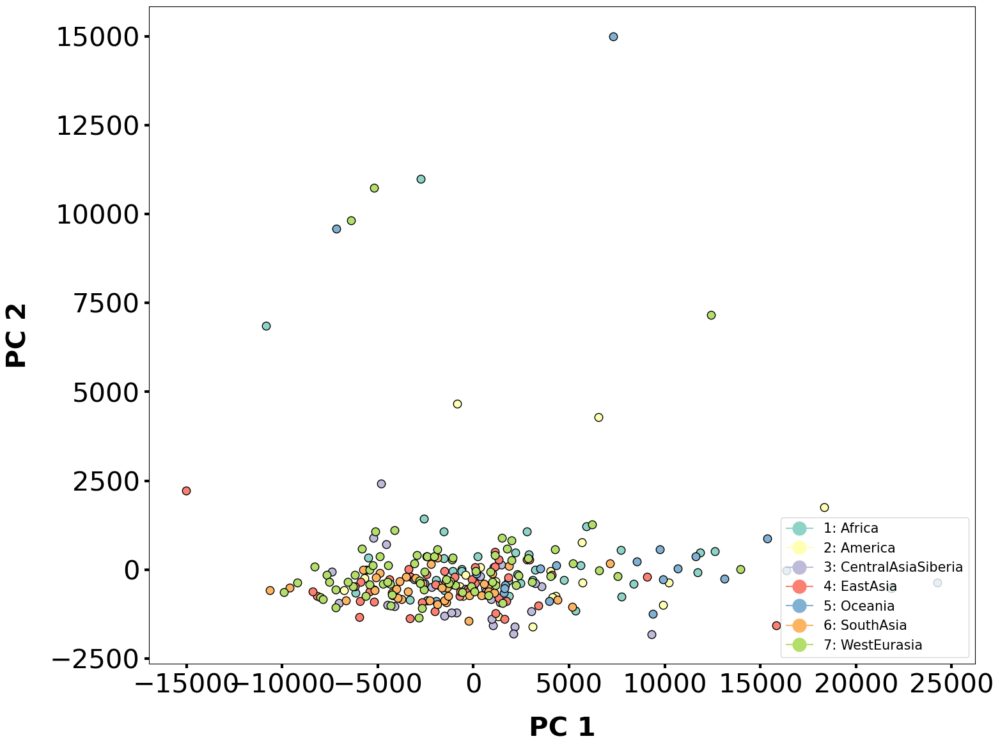

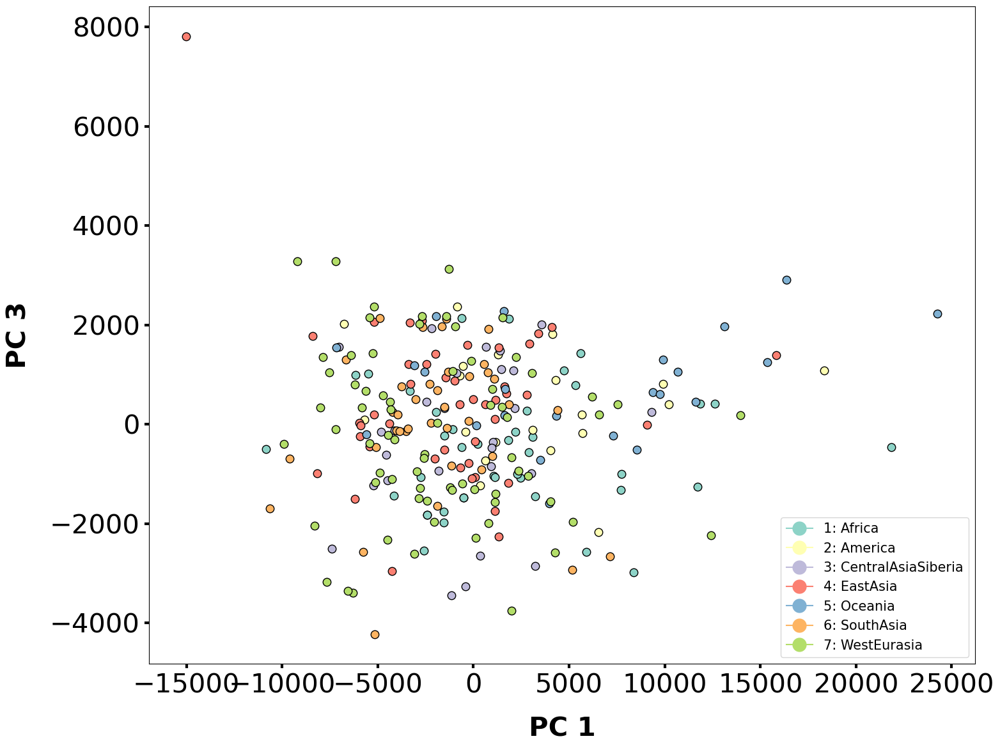

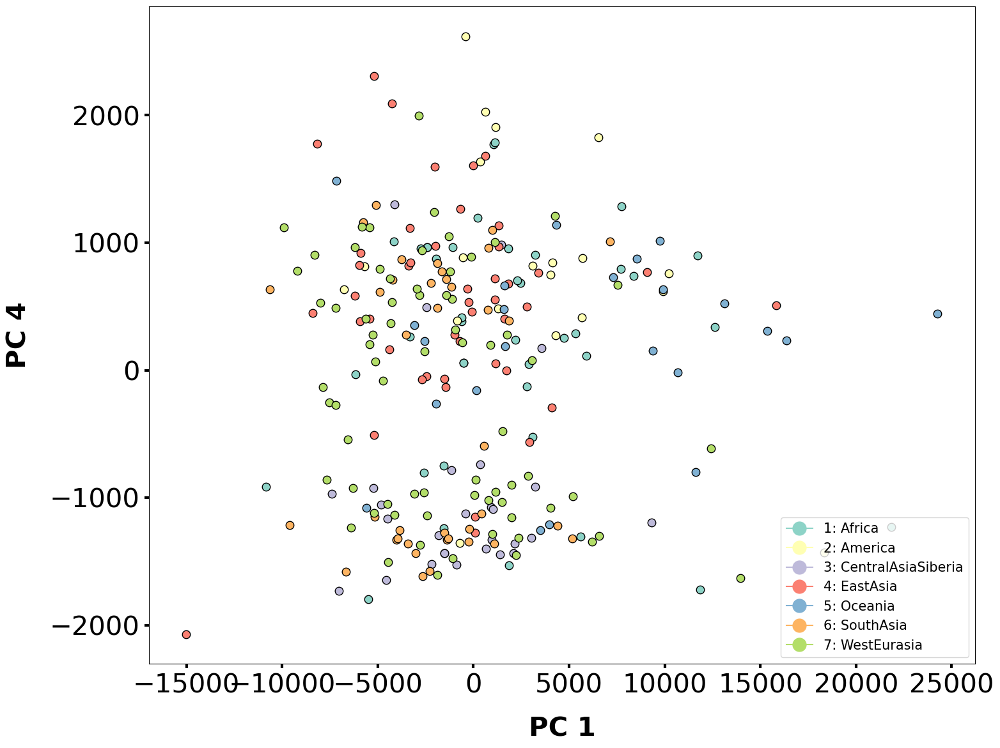

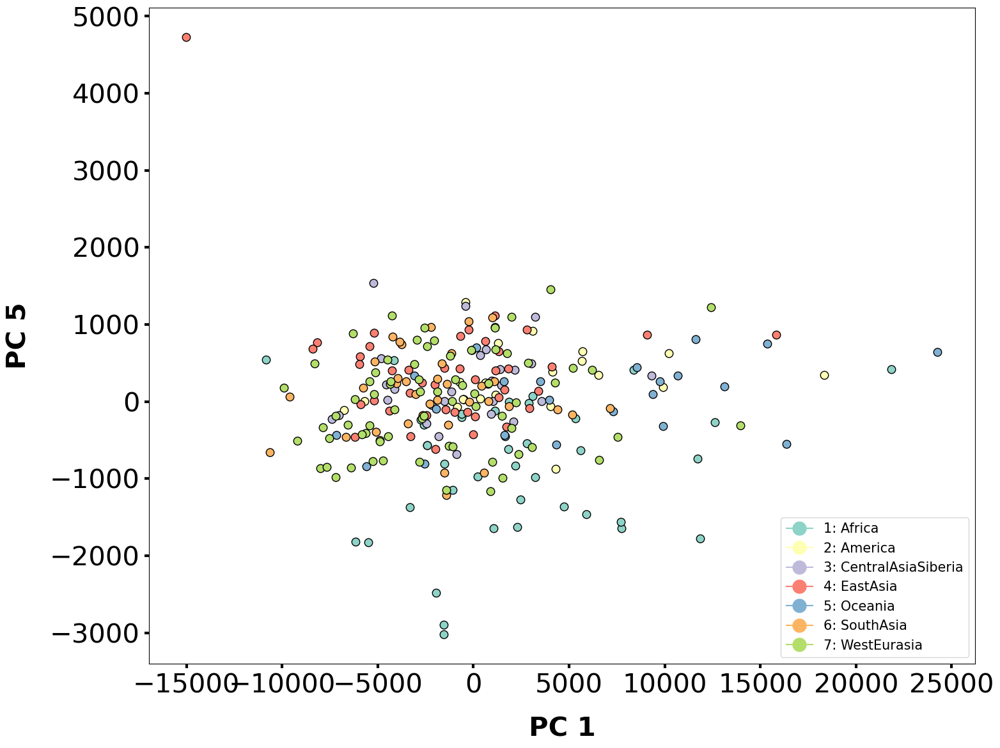

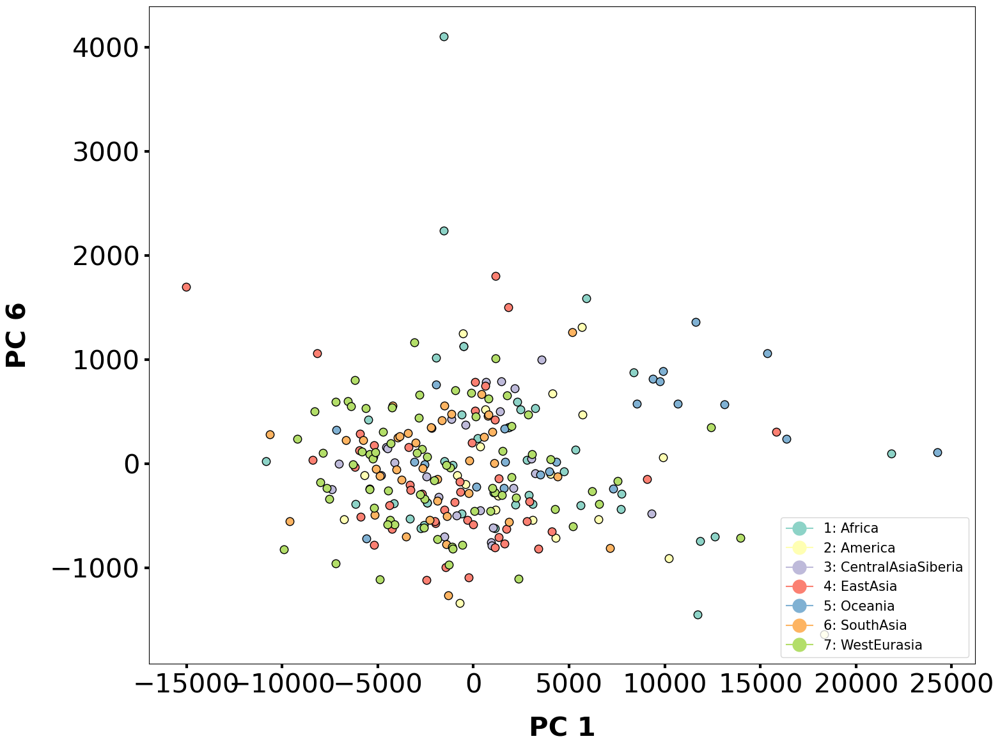

...

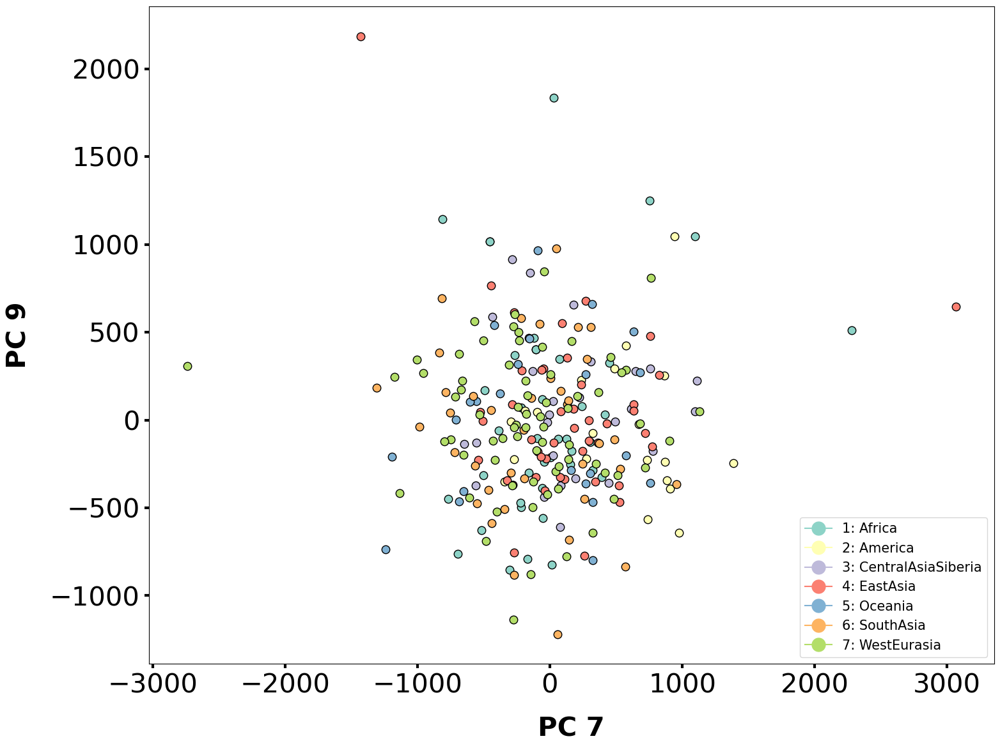

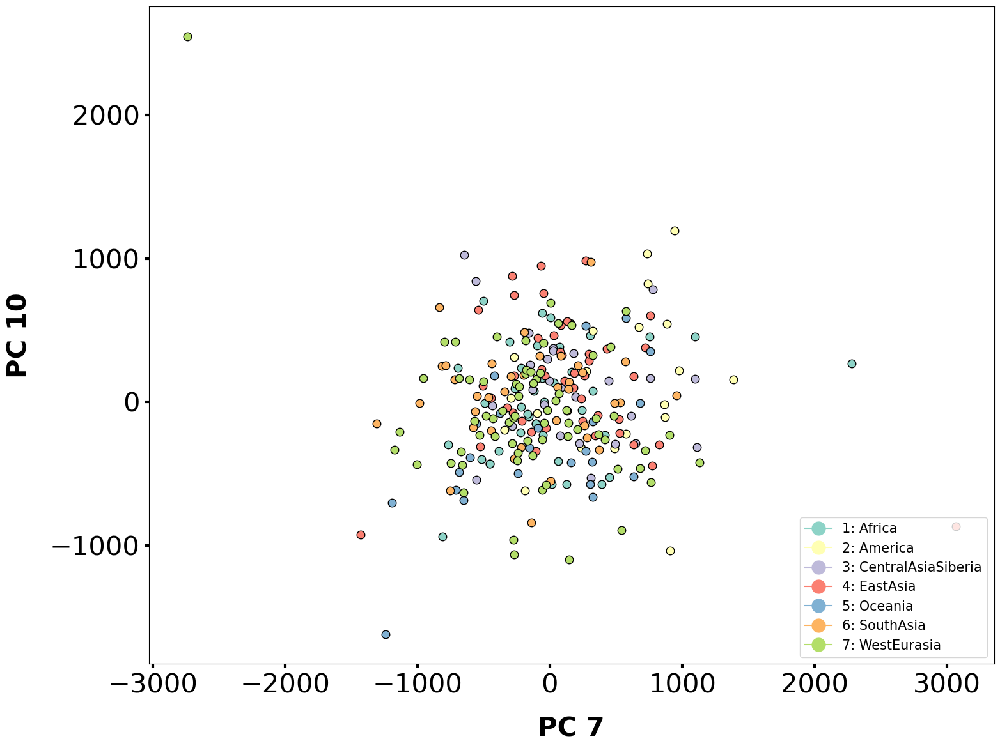

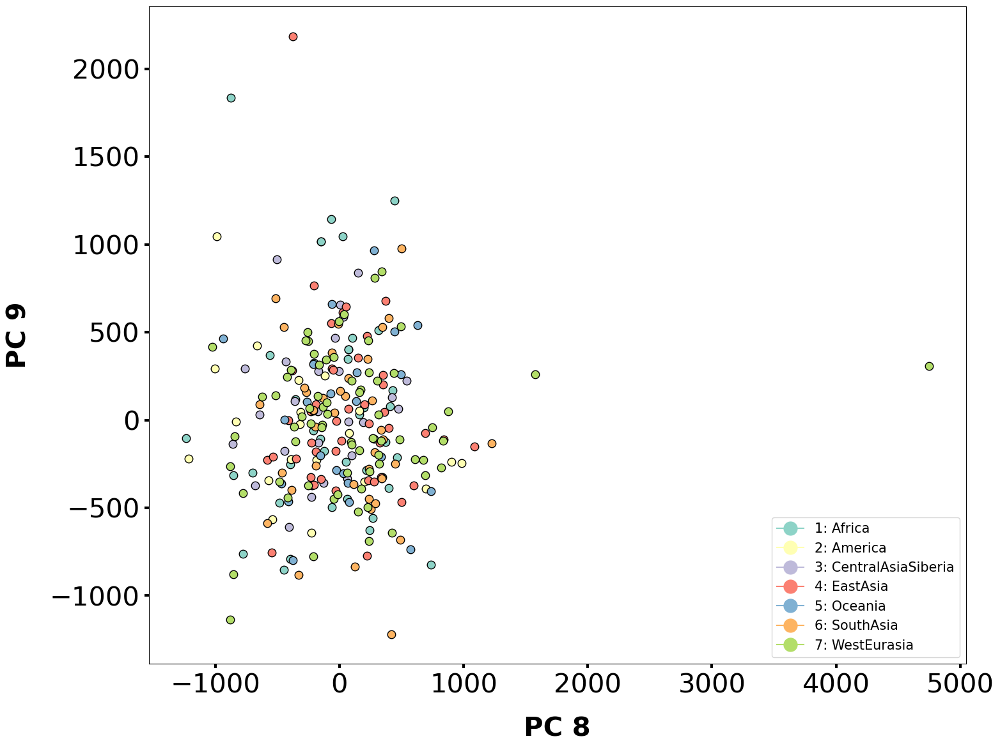

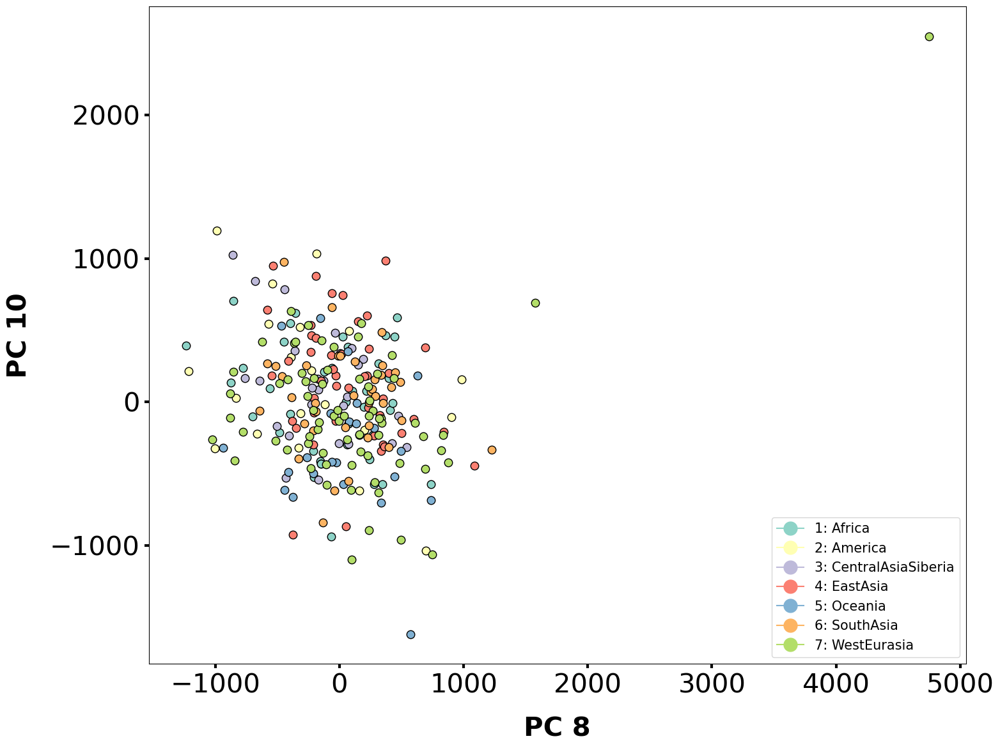

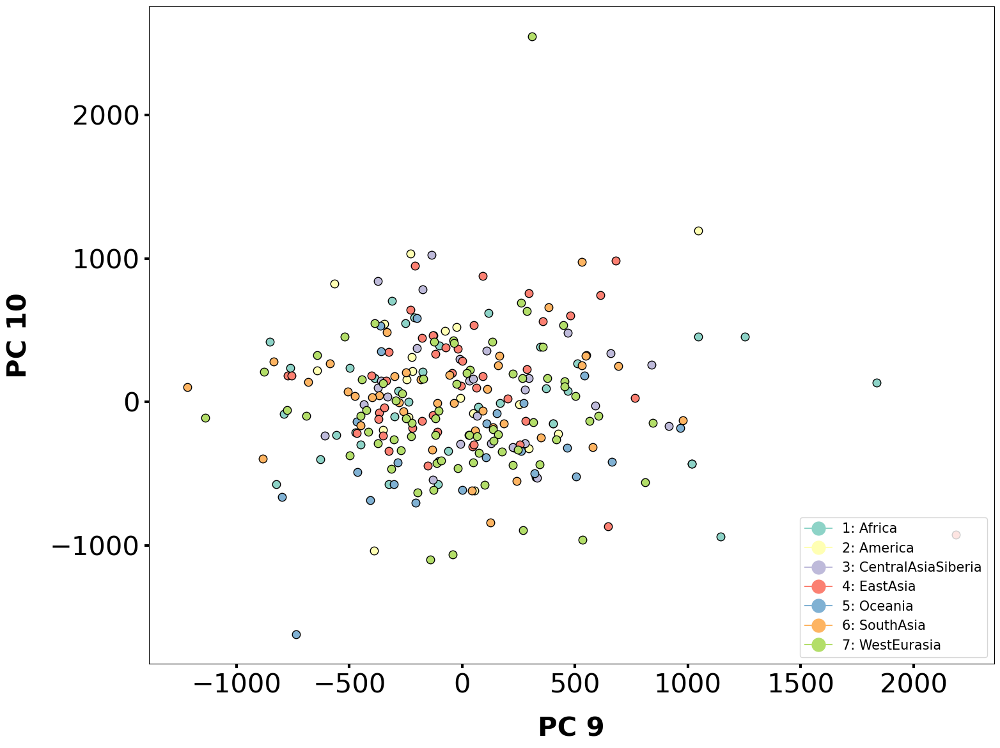

In [43]:
components = [1,2,3,4,5,6,7,8,9,10]

combinations_components = list(combinations(components,2))
for i in combinations_components:
    plot_scatter_cluster(data=df_pca, abscissa='component_'+str(i[0]), ordinate='component_'+str(i[1]), label_horizontal='PC '+ str(i[0]), label_vertical='PC '+str(i[1]), factor='Region', fonts=define_font_properties(), colors=define_color_properties(), legend=True)
    #print(str(i[0]))
#    plot_scatter_cluster(data=df_pca, abscissa='component_8', ordinate='component_9', label_horizontal='Component 1', label_vertical='Component 3', factor='10-Region', fonts=define_font_properties(), colors=define_color_properties(), legend=True)
    

<h1> VST

In [44]:
#coordinates = input_vst.iloc[:,0:2]
cnvs = final_cnv.iloc[:,4:287]
cnvs = cnvs.T
cnvs = cnvs.fillna(2)
cnvs

,47804,47805,47806,47807,47808,47809,47810,47811,47812,47813,...,1004607,1004608,1004609,1004610,1004611,1004612,1004613,1004614,1004615,1004616
Sample,,,,,,,,,,,,,,,,,,,,,
LP6005441-DNA_A03,30.0,31.0,29.0,21.0,13.0,14.0,14.0,12.0,12.0,9.0,...,2.0,2.0,5.0,8.0,11.0,26.0,31.0,27.0,41.0,41.0
LP6005441-DNA_A04,32.0,32.0,31.0,23.0,15.0,16.0,18.0,17.0,15.0,11.0,...,2.0,2.0,6.0,9.0,12.0,27.0,29.0,27.0,39.0,38.0
LP6005441-DNA_A05,35.0,35.0,32.0,25.0,17.0,18.0,18.0,17.0,16.0,14.0,...,2.0,2.0,7.0,9.0,13.0,29.0,29.0,29.0,43.0,43.0
LP6005441-DNA_A06,32.0,32.0,29.0,23.0,14.0,15.0,16.0,14.0,13.0,11.0,...,2.0,2.0,6.0,8.0,11.0,26.0,29.0,26.0,41.0,39.0
LP6005441-DNA_A08,29.0,28.0,26.0,20.0,13.0,14.0,14.0,11.0,12.0,10.0,...,2.0,2.0,6.0,8.0,11.0,23.0,27.0,24.0,37.0,38.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
LP6007069-DNA_A01,38.0,38.0,32.0,24.0,15.0,17.0,17.0,19.0,16.0,12.0,...,2.0,3.0,6.0,8.0,12.0,32.0,31.0,28.0,45.0,41.0
SS6004471,30.0,31.0,24.0,18.0,10.0,11.0,11.0,11.0,10.0,8.0,...,2.0,2.0,5.0,6.0,8.0,25.0,29.0,24.0,39.0,39.0
SS6004477,32.0,32.0,28.0,21.0,13.0,15.0,17.0,18.0,13.0,10.0,...,2.0,2.0,6.0,8.0,11.0,26.0,24.0,23.0,37.0,36.0


In [45]:
dt = features.merge(cnvs, left_index=True, right_index=True)
dt

,Region,47804,47805,47806,47807,47808,47809,47810,47811,47812,...,1004607,1004608,1004609,1004610,1004611,1004612,1004613,1004614,1004615,1004616
Sample,,,,,,,,,,,,,,,,,,,,,
LP6005441-DNA_A03,Oceania,30.0,31.0,29.0,21.0,13.0,14.0,14.0,12.0,12.0,...,2.0,2.0,5.0,8.0,11.0,26.0,31.0,27.0,41.0,41.0
LP6005441-DNA_A04,America,32.0,32.0,31.0,23.0,15.0,16.0,18.0,17.0,15.0,...,2.0,2.0,6.0,9.0,12.0,27.0,29.0,27.0,39.0,38.0
LP6005441-DNA_A05,WestEurasia,35.0,35.0,32.0,25.0,17.0,18.0,18.0,17.0,16.0,...,2.0,2.0,7.0,9.0,13.0,29.0,29.0,29.0,43.0,43.0
LP6005441-DNA_A06,WestEurasia,32.0,32.0,29.0,23.0,14.0,15.0,16.0,14.0,13.0,...,2.0,2.0,6.0,8.0,11.0,26.0,29.0,26.0,41.0,39.0
LP6005441-DNA_A08,Africa,29.0,28.0,26.0,20.0,13.0,14.0,14.0,11.0,12.0,...,2.0,2.0,6.0,8.0,11.0,23.0,27.0,24.0,37.0,38.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
LP6007069-DNA_A01,WestEurasia,38.0,38.0,32.0,24.0,15.0,17.0,17.0,19.0,16.0,...,2.0,3.0,6.0,8.0,12.0,32.0,31.0,28.0,45.0,41.0
SS6004471,Africa,30.0,31.0,24.0,18.0,10.0,11.0,11.0,11.0,10.0,...,2.0,2.0,5.0,6.0,8.0,25.0,29.0,24.0,39.0,39.0
SS6004477,Oceania,32.0,32.0,28.0,21.0,13.0,15.0,17.0,18.0,13.0,...,2.0,2.0,6.0,8.0,11.0,26.0,24.0,23.0,37.0,36.0


<h1> New Vst

In [46]:
####### Groupby regions #######
dt_group = dt.groupby('Region')

dt_groupped = []
regions = features['Region'].unique()
regions.sort()
for i in regions:
    dt_groupped.append(dt_group.get_group(str(i)))
    

dt_groupped

[                   Region  47804  47805  47806  47807  47808  47809  47810  \
 Sample                                                                       
 LP6005441-DNA_A08  Africa   29.0   28.0   26.0   20.0   13.0   14.0   14.0   
 LP6005441-DNA_A11  Africa   29.0   29.0   26.0   21.0   13.0   14.0   13.0   
 LP6005441-DNA_B02  Africa   30.0   30.0   26.0   22.0   14.0   15.0   15.0   
 LP6005441-DNA_B08  Africa   30.0   30.0   26.0   20.0   12.0   13.0   15.0   
 LP6005441-DNA_B11  Africa   30.0   29.0   26.0   22.0   14.0   14.0   14.0   
 LP6005441-DNA_E07  Africa   31.0   30.0   29.0   23.0   14.0   15.0   15.0   
 LP6005441-DNA_F01  Africa   31.0   32.0   28.0   23.0   15.0   16.0   15.0   
 LP6005441-DNA_F07  Africa   31.0   32.0   30.0   24.0   17.0   18.0   17.0   
 LP6005441-DNA_G02  Africa   29.0   29.0   25.0   20.0   12.0   13.0   13.0   
 LP6005441-DNA_G08  Africa   33.0   32.0   31.0   24.0   16.0   17.0   17.0   
 LP6005441-DNA_H02  Africa   31.0   30.0   28.0   22

In [47]:
#### Names to pair-population
regions = dt['Region'].unique()
regions.sort()
combination_names = []
for i in list(combinations(regions,2)):
    combination_names.append(i[0]+str('-')+i[1])

for j in dt_groupped:
    del j['Region']


In [48]:
## Function for Vst 
def vst_function(
    x=None, 
    y=None):

    vx = np.var(x, axis=0)
    vy = np.var(y, axis=0)

    nx = len(x)
    ny = len(y)

## Vt 
    a = np.concatenate((x,y))
    vt = np.ndarray.var(a,axis=0)

### Vs = (V1*n1+V2*n2)/(n1+n2) 

    v1 = vx*nx
    v2 = vy*ny
    ns = nx+ny
    vs = (v1+v2)/ ns
    ########## Vst #################
    #####(VT−VS)/VT
    
    vst = (vt-vs)/vt
    
    return(vst) 


combination_regions = list(combinations([0,1,2,3,4,5,6],2))

vst_list = []
for region in combination_regions:
    vx = np.var(dt_groupped[region[0]])
    vy = np.var(dt_groupped[region[1]])

    nx = len(dt_groupped[region[0]])
    ny = len(dt_groupped[region[1]])

## Vt 
    a = np.concatenate((dt_groupped[region[0]], dt_groupped[region[1]]))
    vt = np.ndarray.var(a,axis=0)

### Vs = (V1*n1+V2*n2)/(n1+n2) 

    v1 = vx*nx
    v2 = vy*ny
    ns = nx+ny
    vs = (v1+v2)/ ns
    ########## Vst #################
    #####(VT−VS)/VT
    
    vst = (vt-vs)/vt
    
    vst_list.append(vst)

/opt/anaconda3/lib/python3.11/site-packages/numpy/core/fromnumeric.py:3785: FutureWarning: The behavior of DataFrame.var with axis=None is deprecated, in a future version this will reduce over both axes and return a scalar. To retain the old behavior, pass axis=0 (or do not pass axis)
  return var(axis=axis, dtype=dtype, out=out, ddof=ddof, **kwargs)


In [136]:
## VST for pair-population
vst_dt = []

combination_regions = list(combinations([0,1,2,3,4,5,6],2))
for region in combination_regions:
        statistic = vst_function((dt_groupped[region[0]]), (dt_groupped[region[1]]))
        vst_dt.append(statistic)

vst_dt = pd.DataFrame(vst_dt).set_axis(combination_names)
vst_dt

,47804,47805,47806,47807,47808,47809,47810,47811,47812,47813,...,1004607,1004608,1004609,1004610,1004611,1004612,1004613,1004614,1004615,1004616
Africa-America,7.291809e-02,6.487471e-02,0.101789,0.035695,0.000893,0.012292,0.266945,0.309779,0.058864,0.006898,...,0.004558,NaN,0.124396,0.019634,0.035464,0.030952,0.083816,0.004226,0.000033,0.051568
Africa-CentralAsiaSiberia,1.657446e-01,2.386249e-01,0.261818,0.262695,0.190129,0.189222,0.451925,0.336320,0.258199,0.207396,...,0.014013,0.046016,0.295049,0.183037,0.211568,0.206925,0.000427,0.146306,0.085577,0.225881
Africa-EastAsia,1.351768e-03,5.553886e-05,0.006236,0.007110,0.004653,0.031890,0.165721,0.201558,0.060618,0.030044,...,0.000052,NaN,0.067872,0.044311,0.028728,0.003665,0.078798,0.016173,0.007403,0.001668
Africa-Oceania,3.762386e-03,1.686926e-03,0.015658,0.051016,0.077338,0.024574,0.016716,0.051984,0.016056,0.064304,...,0.008904,NaN,0.000011,0.013079,0.021834,0.001777,0.045397,0.000762,0.005092,0.041468
Africa-SouthAsia,1.365937e-02,2.057550e-02,0.134324,0.041341,0.045739,0.032372,0.253240,0.278753,0.107278,0.074334,...,0.011882,NaN,0.039978,0.013560,0.048300,0.031689,0.029280,0.019482,0.034683,0.054523
Africa-WestEurasia,2.313127e-03,1.328698e-03,0.054034,0.019612,0.002518,0.005904,0.104394,0.094848,0.020123,0.004738,...,0.002150,0.015894,0.054762,0.011097,0.013194,0.023663,0.000008,0.011381,0.018761,0.124574
America-CentralAsiaSiberia,4.068447e-02,1.229719e-01,0.095947,0.172969,0.201093,0.154235,0.117186,0.012696,0.133156,0.202151,...,0.002371,0.032922,0.083893,0.124125,0.126599,0.136988,0.114288,0.165607,0.089637,0.128109
America-EastAsia,1.490317e-02,2.344361e-02,0.020827,0.004343,0.001409,0.003426,0.015069,0.017912,0.001423,0.008072,...,0.005511,NaN,0.024024,0.003966,0.001919,0.023543,0.002860,0.025121,0.005986,0.028453
America-Oceania,6.681345e-02,8.019481e-02,0.056314,0.176584,0.124722,0.094218,0.161074,0.117489,0.160027,0.126889,...,0.027381,NaN,0.186957,0.099391,0.146741,0.048525,0.006717,0.002308,0.009566,0.000397
America-SouthAsia,3.550375e-02,1.695906e-02,0.001885,0.000382,0.045373,0.004062,0.007006,0.003337,0.006065,0.048357,...,0.033333,NaN,0.067857,0.002215,0.000441,0.000029,0.018829,0.007858,0.039493,0.000051


In [137]:
filtering_vst = pd.DataFrame(vst_dt)>=0.2
filtering_vst = filtering_vst.loc[:, filtering_vst.any()]
#filtering_vst = filtering_vst.set_axis(combination_names)
filtering_vst

,47805,47806,47807,47808,47809,47810,47811,47812,47813,47814,...,1003957,1004068,1004102,1004103,1004544,1004609,1004610,1004611,1004612,1004616
Africa-America,False,False,False,False,False,True,True,False,False,True,...,False,False,False,False,False,False,False,False,False,False
Africa-CentralAsiaSiberia,True,True,True,False,False,True,True,True,True,True,...,False,False,True,False,False,True,False,True,True,True
Africa-EastAsia,False,False,False,False,False,False,True,False,False,True,...,False,False,True,True,False,False,False,False,False,False
Africa-Oceania,False,False,False,False,False,False,False,False,False,False,...,False,False,True,True,False,False,False,False,False,False
Africa-SouthAsia,False,False,False,False,False,True,True,False,False,True,...,False,False,False,False,False,False,False,False,False,False
Africa-WestEurasia,False,False,False,False,False,False,False,False,False,True,...,False,False,False,False,True,False,False,False,False,False
America-CentralAsiaSiberia,False,False,False,True,False,False,False,False,True,False,...,True,False,True,False,False,False,False,False,False,False
America-EastAsia,False,False,False,False,False,False,False,False,False,False,...,False,False,True,False,False,False,False,False,False,False
America-Oceania,False,False,False,False,False,False,False,False,False,True,...,False,False,True,True,False,False,False,False,False,False
America-SouthAsia,False,False,False,False,False,False,False,False,False,False,...,False,True,False,False,False,False,False,False,False,False


In [138]:
#filtering_vst = pd.DataFrame(vst_dt)>=0.3
#filtering_vst = filtering_vst.loc[:, filtering_vst.any()]

#filtering_vst = filtering_vst.T
#filtering_vst


In [139]:
filtering_vst

,47805,47806,47807,47808,47809,47810,47811,47812,47813,47814,...,1003957,1004068,1004102,1004103,1004544,1004609,1004610,1004611,1004612,1004616
Africa-America,False,False,False,False,False,True,True,False,False,True,...,False,False,False,False,False,False,False,False,False,False
Africa-CentralAsiaSiberia,True,True,True,False,False,True,True,True,True,True,...,False,False,True,False,False,True,False,True,True,True
Africa-EastAsia,False,False,False,False,False,False,True,False,False,True,...,False,False,True,True,False,False,False,False,False,False
Africa-Oceania,False,False,False,False,False,False,False,False,False,False,...,False,False,True,True,False,False,False,False,False,False
Africa-SouthAsia,False,False,False,False,False,True,True,False,False,True,...,False,False,False,False,False,False,False,False,False,False
Africa-WestEurasia,False,False,False,False,False,False,False,False,False,True,...,False,False,False,False,True,False,False,False,False,False
America-CentralAsiaSiberia,False,False,False,True,False,False,False,False,True,False,...,True,False,True,False,False,False,False,False,False,False
America-EastAsia,False,False,False,False,False,False,False,False,False,False,...,False,False,True,False,False,False,False,False,False,False
America-Oceania,False,False,False,False,False,False,False,False,False,True,...,False,False,True,True,False,False,False,False,False,False
America-SouthAsia,False,False,False,False,False,False,False,False,False,False,...,False,True,False,False,False,False,False,False,False,False


In [140]:
## Coordinates anotation 
vst_dt = vst_dt.T
vst_dt.insert (0, 'Chromosome', final_cnv['Chromosome'])
vst_dt.insert (1, 'Start', final_cnv['Start'])
vst_dt.insert (2, 'End', final_cnv['End'])
#vst_dt.insert (3, 'Type', final_cnv['Type'])
vst_dt = vst_dt.round(5)
vst_dt = vst_dt.replace(np.NaN, 0)
vst_dt

,Chromosome,Start,End,Africa-America,Africa-CentralAsiaSiberia,Africa-EastAsia,Africa-Oceania,Africa-SouthAsia,Africa-WestEurasia,America-CentralAsiaSiberia,...,CentralAsiaSiberia-EastAsia,CentralAsiaSiberia-Oceania,CentralAsiaSiberia-SouthAsia,CentralAsiaSiberia-WestEurasia,EastAsia-Oceania,EastAsia-SouthAsia,EastAsia-WestEurasia,Oceania-SouthAsia,Oceania-WestEurasia,SouthAsia-WestEurasia
47804,22,0,20541,0.07292,0.16574,0.00135,0.00376,0.01366,0.00231,0.04068,...,0.06004,0.14318,0.12172,0.09435,0.00000,0.00117,0.00000,0.00317,0.00001,0.00204
47805,22,20541,22327,0.06487,0.23862,0.00006,0.00169,0.02058,0.00133,0.12297,...,0.12760,0.23588,0.17594,0.17511,0.00097,0.01014,0.00124,0.01206,0.00000,0.00797
47806,22,22327,23327,0.10179,0.26182,0.00624,0.01566,0.13432,0.05403,0.09595,...,0.10336,0.20289,0.06908,0.10453,0.00021,0.03624,0.01059,0.06600,0.01024,0.01668
47807,22,23327,25569,0.03569,0.26269,0.00711,0.05102,0.04134,0.01961,0.17297,...,0.12433,0.42361,0.21613,0.11016,0.06200,0.00433,0.00193,0.19550,0.08939,0.00030
47808,22,25569,26687,0.00089,0.19013,0.00465,0.07734,0.04574,0.00252,0.20109,...,0.20530,0.38616,0.12486,0.15397,0.15194,0.03386,0.00011,0.26922,0.09351,0.02369
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1004612,1,248364795,248366351,0.03095,0.20693,0.00367,0.00178,0.03169,0.02366,0.13699,...,0.12667,0.21485,0.11121,0.06596,0.00063,0.03104,0.03167,0.04181,0.02664,0.00003
1004613,1,248366351,248367622,0.08382,0.00043,0.07880,0.04540,0.02928,0.00001,0.11429,...,0.07770,0.06082,0.03758,0.00024,0.01129,0.02577,0.08295,0.00317,0.03602,0.02618
1004614,1,248367622,248368745,0.00423,0.14631,0.01617,0.00076,0.01948,0.01138,0.16561,...,0.14762,0.16146,0.09538,0.10127,0.01864,0.05230,0.04879,0.01460,0.00571,0.00138
1004615,1,248368745,248370339,0.00003,0.08558,0.00740,0.00509,0.03468,0.01876,0.08964,...,0.06668,0.12754,0.18055,0.13187,0.00152,0.00094,0.00007,0.01550,0.00478,0.00111


In [141]:
vst_dt.to_csv('../data/vst_results_t2tchm13.csv', index=False)

In [142]:
filtering_vst.index

Index(['Africa-America', 'Africa-CentralAsiaSiberia', 'Africa-EastAsia',
       'Africa-Oceania', 'Africa-SouthAsia', 'Africa-WestEurasia',
       'America-CentralAsiaSiberia', 'America-EastAsia', 'America-Oceania',
       'America-SouthAsia', 'America-WestEurasia',
       'CentralAsiaSiberia-EastAsia', 'CentralAsiaSiberia-Oceania',
       'CentralAsiaSiberia-SouthAsia', 'CentralAsiaSiberia-WestEurasia',
       'EastAsia-Oceania', 'EastAsia-SouthAsia', 'EastAsia-WestEurasia',
       'Oceania-SouthAsia', 'Oceania-WestEurasia', 'SouthAsia-WestEurasia'],
      dtype='object')

In [144]:
vst_dt_filtered = vst_dt.loc[filtering_vst.T.index]
vst_dt_filtered#.sort_values(by=['WestEurasia-Oceania'], ascending=False).head(50)
vst_dt_filtered.to_csv('vst_candidates_chm13t2t.csv', index=False)
vst_dt_filtered

,Chromosome,Start,End,Africa-America,Africa-CentralAsiaSiberia,Africa-EastAsia,Africa-Oceania,Africa-SouthAsia,Africa-WestEurasia,America-CentralAsiaSiberia,...,CentralAsiaSiberia-EastAsia,CentralAsiaSiberia-Oceania,CentralAsiaSiberia-SouthAsia,CentralAsiaSiberia-WestEurasia,EastAsia-Oceania,EastAsia-SouthAsia,EastAsia-WestEurasia,Oceania-SouthAsia,Oceania-WestEurasia,SouthAsia-WestEurasia
47805,22,20541,22327,0.06487,0.23862,0.00006,0.00169,0.02058,0.00133,0.12297,...,0.12760,0.23588,0.17594,0.17511,0.00097,0.01014,0.00124,0.01206,0.00000,0.00797
47806,22,22327,23327,0.10179,0.26182,0.00624,0.01566,0.13432,0.05403,0.09595,...,0.10336,0.20289,0.06908,0.10453,0.00021,0.03624,0.01059,0.06600,0.01024,0.01668
47807,22,23327,25569,0.03569,0.26269,0.00711,0.05102,0.04134,0.01961,0.17297,...,0.12433,0.42361,0.21613,0.11016,0.06200,0.00433,0.00193,0.19550,0.08939,0.00030
47808,22,25569,26687,0.00089,0.19013,0.00465,0.07734,0.04574,0.00252,0.20109,...,0.20530,0.38616,0.12486,0.15397,0.15194,0.03386,0.00011,0.26922,0.09351,0.02369
47809,22,26687,27687,0.01229,0.18922,0.03189,0.02457,0.03237,0.00590,0.15424,...,0.14141,0.32021,0.14667,0.10697,0.13169,0.00000,0.00531,0.14131,0.03963,0.00518
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1004609,1,248356907,248362706,0.12440,0.29505,0.06787,0.00001,0.03998,0.05476,0.08389,...,0.17658,0.34687,0.25412,0.21491,0.08019,0.00841,0.00276,0.05601,0.05933,0.00164
1004610,1,248362706,248363706,0.01963,0.18304,0.04431,0.01308,0.01356,0.01110,0.12412,...,0.07619,0.35530,0.16332,0.08310,0.11638,0.01380,0.00731,0.07432,0.03681,0.00009
1004611,1,248363706,248364795,0.03546,0.21157,0.02873,0.02183,0.04830,0.01319,0.12660,...,0.15679,0.32366,0.12141,0.15681,0.11199,0.00449,0.00273,0.14729,0.06353,0.01205
1004612,1,248364795,248366351,0.03095,0.20693,0.00367,0.00178,0.03169,0.02366,0.13699,...,0.12667,0.21485,0.11121,0.06596,0.00063,0.03104,0.03167,0.04181,0.02664,0.00003


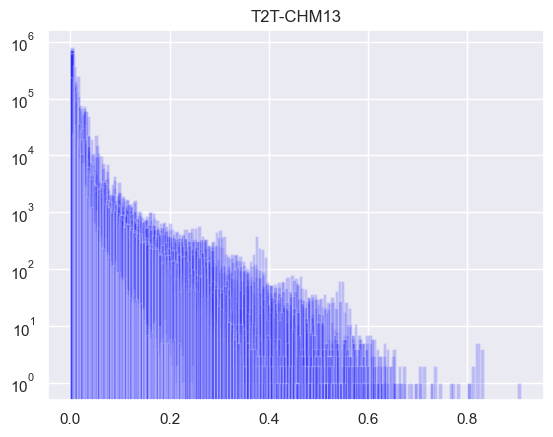

In [145]:
#sns.set_palette("bright")
for i in vst_dt.iloc[:,4:25].columns:
    plt.hist(vst_dt[i], bins=100, alpha=0.2, log=True,color="blue")
    plt.title('T2T-CHM13')

/opt/anaconda3/lib/python3.11/site-packages/pandas/plotting/_matplotlib/tools.py:225: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  fig = plt.figure(**fig_kw)


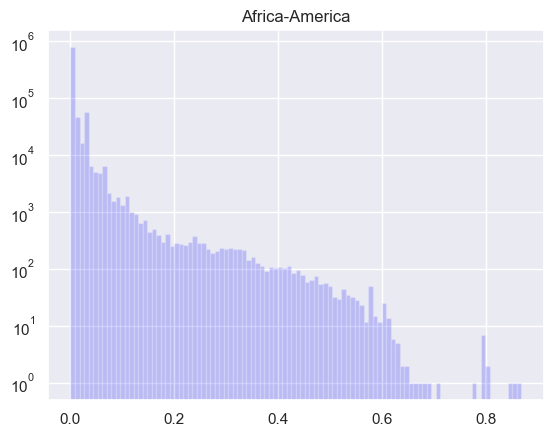

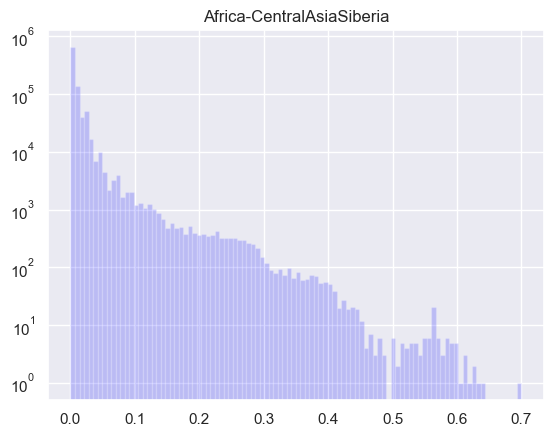

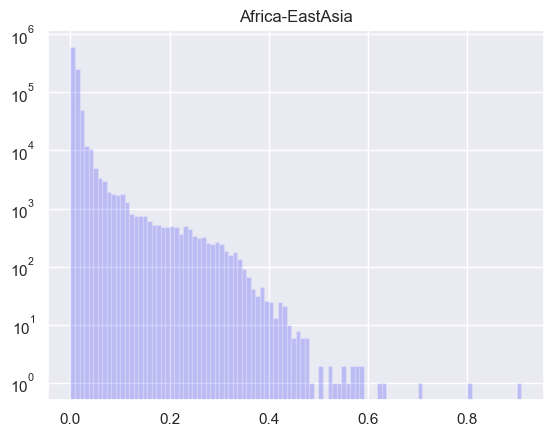

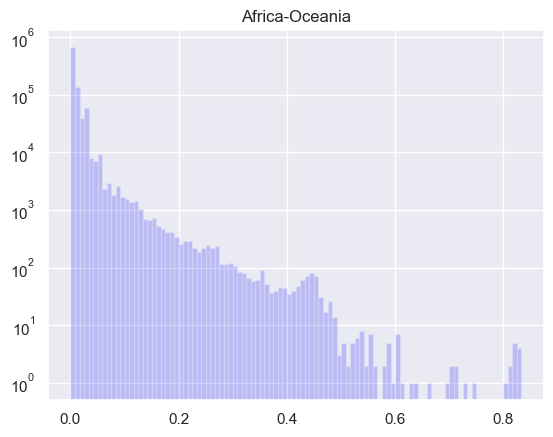

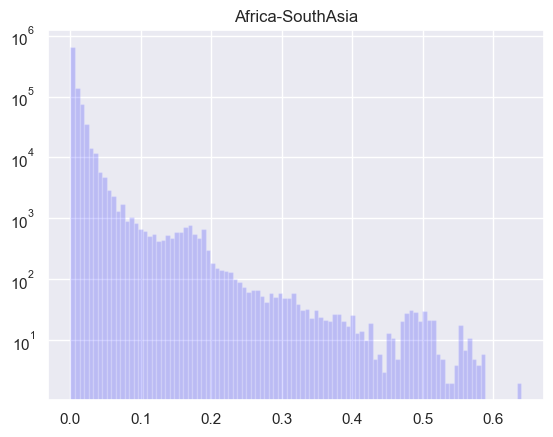

...

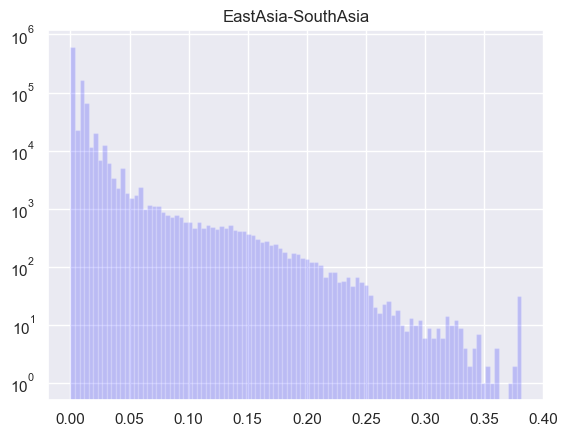

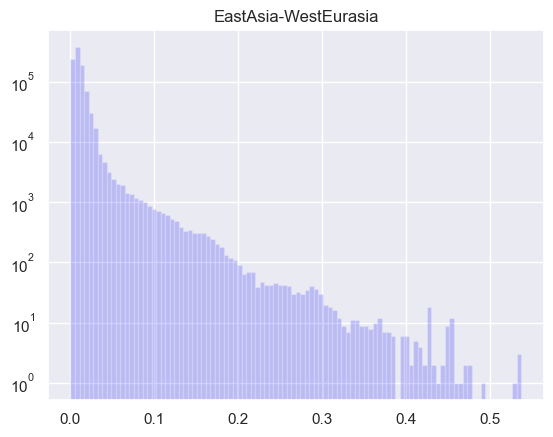

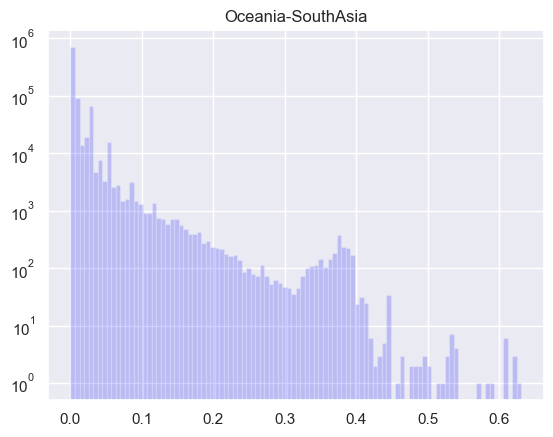

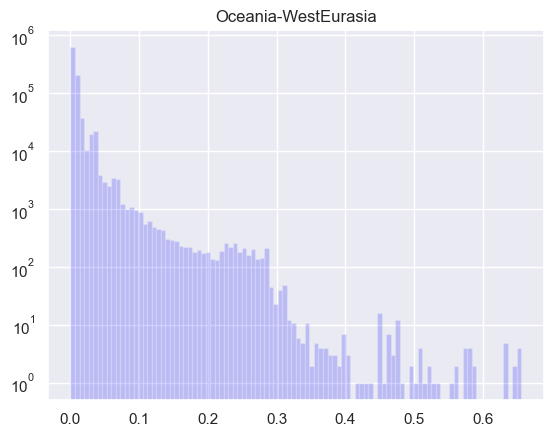

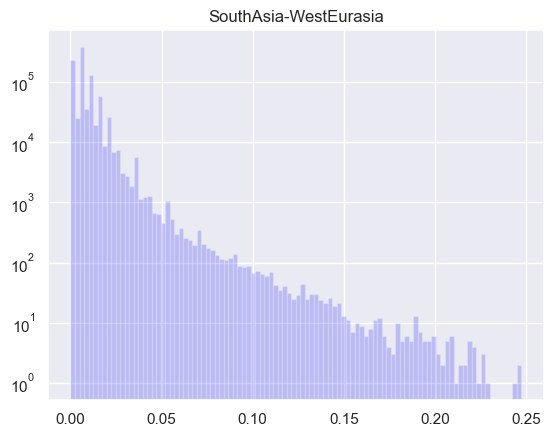

In [146]:
for col in vst_dt.iloc[:,3:25].columns: 
    try:      
        vst_dt.iloc[:,3:25][col] = pd.to_numeric(vst_dt.iloc[:,3:25][col]) 
        vst_dt.iloc[:,3:25].hist(column=col, bins=100, alpha=0.2, color="blue", log=True)
    except ValueError:
        print('This column can not be represented as a histogram')

<Axes: >

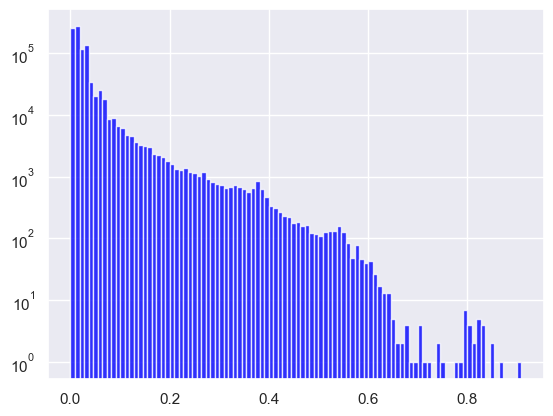

In [147]:
vst_dt.iloc[:,3:25].max(axis=1).hist(bins=100, alpha=0.8, log=True, color="blue")

In [148]:
vst_dt_filtered = vst_dt.loc[filtering_vst.T.index]
vst_dt_filtered.to_csv('vst_candidates_chm13t2t.csv', index=False)


In [149]:
vst_dt_filtered

,Chromosome,Start,End,Africa-America,Africa-CentralAsiaSiberia,Africa-EastAsia,Africa-Oceania,Africa-SouthAsia,Africa-WestEurasia,America-CentralAsiaSiberia,...,CentralAsiaSiberia-EastAsia,CentralAsiaSiberia-Oceania,CentralAsiaSiberia-SouthAsia,CentralAsiaSiberia-WestEurasia,EastAsia-Oceania,EastAsia-SouthAsia,EastAsia-WestEurasia,Oceania-SouthAsia,Oceania-WestEurasia,SouthAsia-WestEurasia
47805,22,20541,22327,0.06487,0.23862,0.00006,0.00169,0.02058,0.00133,0.12297,...,0.12760,0.23588,0.17594,0.17511,0.00097,0.01014,0.00124,0.01206,0.00000,0.00797
47806,22,22327,23327,0.10179,0.26182,0.00624,0.01566,0.13432,0.05403,0.09595,...,0.10336,0.20289,0.06908,0.10453,0.00021,0.03624,0.01059,0.06600,0.01024,0.01668
47807,22,23327,25569,0.03569,0.26269,0.00711,0.05102,0.04134,0.01961,0.17297,...,0.12433,0.42361,0.21613,0.11016,0.06200,0.00433,0.00193,0.19550,0.08939,0.00030
47808,22,25569,26687,0.00089,0.19013,0.00465,0.07734,0.04574,0.00252,0.20109,...,0.20530,0.38616,0.12486,0.15397,0.15194,0.03386,0.00011,0.26922,0.09351,0.02369
47809,22,26687,27687,0.01229,0.18922,0.03189,0.02457,0.03237,0.00590,0.15424,...,0.14141,0.32021,0.14667,0.10697,0.13169,0.00000,0.00531,0.14131,0.03963,0.00518
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1004609,1,248356907,248362706,0.12440,0.29505,0.06787,0.00001,0.03998,0.05476,0.08389,...,0.17658,0.34687,0.25412,0.21491,0.08019,0.00841,0.00276,0.05601,0.05933,0.00164
1004610,1,248362706,248363706,0.01963,0.18304,0.04431,0.01308,0.01356,0.01110,0.12412,...,0.07619,0.35530,0.16332,0.08310,0.11638,0.01380,0.00731,0.07432,0.03681,0.00009
1004611,1,248363706,248364795,0.03546,0.21157,0.02873,0.02183,0.04830,0.01319,0.12660,...,0.15679,0.32366,0.12141,0.15681,0.11199,0.00449,0.00273,0.14729,0.06353,0.01205
1004612,1,248364795,248366351,0.03095,0.20693,0.00367,0.00178,0.03169,0.02366,0.13699,...,0.12667,0.21485,0.11121,0.06596,0.00063,0.03104,0.03167,0.04181,0.02664,0.00003


In [115]:
filtering_vst

,47805,47806,47807,47808,47809,47810,47811,47812,47813,47814,...,1003957,1004068,1004102,1004103,1004544,1004609,1004610,1004611,1004612,1004616
Africa-America,False,False,False,False,False,True,True,False,False,True,...,False,False,False,False,False,False,False,False,False,False
Africa-CentralAsiaSiberia,True,True,True,False,False,True,True,True,True,True,...,False,False,True,False,False,True,False,True,True,True
Africa-EastAsia,False,False,False,False,False,False,True,False,False,True,...,False,False,True,True,False,False,False,False,False,False
Africa-Oceania,False,False,False,False,False,False,False,False,False,False,...,False,False,True,True,False,False,False,False,False,False
Africa-SouthAsia,False,False,False,False,False,True,True,False,False,True,...,False,False,False,False,False,False,False,False,False,False
Africa-WestEurasia,False,False,False,False,False,False,False,False,False,True,...,False,False,False,False,True,False,False,False,False,False
America-CentralAsiaSiberia,False,False,False,True,False,False,False,False,True,False,...,True,False,True,False,False,False,False,False,False,False
America-EastAsia,False,False,False,False,False,False,False,False,False,False,...,False,False,True,False,False,False,False,False,False,False
America-Oceania,False,False,False,False,False,False,False,False,False,True,...,False,False,True,True,False,False,False,False,False,False
America-SouthAsia,False,False,False,False,False,False,False,False,False,False,...,False,True,False,False,False,False,False,False,False,False


<Axes: >

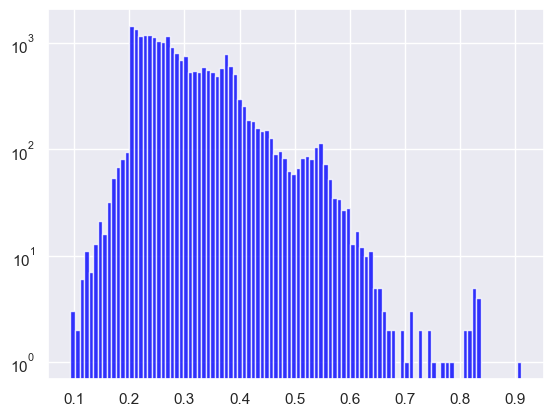

In [116]:
vst_dt_filtered.iloc[:,4:25].max(axis=1).hist(bins=100, alpha=0.8, log=True, color="blue")

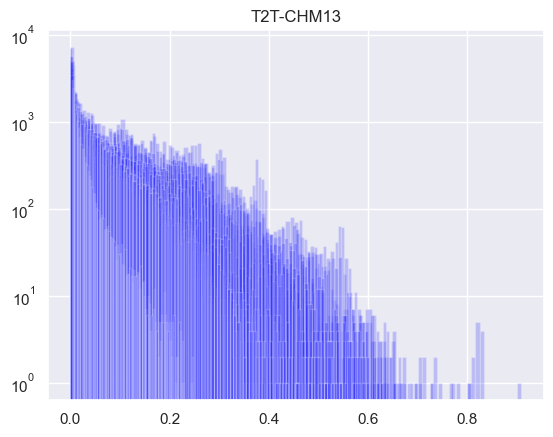

In [117]:
#sns.set_palette("bright")
for i in vst_dt_filtered.iloc[:,4:25].columns:
    plt.hist(vst_dt_filtered[i], bins=100, alpha=0.2, log=True,color="blue")
    plt.title('T2T-CHM13')

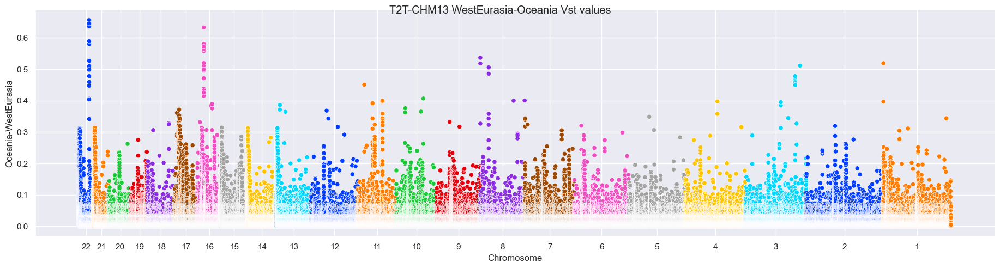

In [118]:
# Simulate DataFrame
#vst_dt['i']= vst_dt.index
vst_dt["i"] = pd.to_numeric(vst_dt.index, downcast="float")

#vst_dt['log_West_Oceania'] = np.log2(vst_dt['WestEurasia-Oceania'])

# Generate Manhattan plot: (#optional tweaks for relplot: linewidth=0, s=9)
plot = sns.relplot(data=vst_dt, x='i', y='Oceania-WestEurasia', aspect=3.7, 
                  hue='Chromosome', palette = 'bright', legend=None) 
chrom_df=vst_dt.groupby('Chromosome')['i'].median()
plot.ax.set_xlabel('Chromosome'); plot.ax.set_xticks(chrom_df);
plot.ax.set_xticklabels(chrom_df.index)
plot.fig.suptitle('T2T-CHM13 WestEurasia-Oceania Vst values');

In [54]:
## Saving Vst coordinates as bed file to liftover

vst_dt_filtered.iloc[:,0:4].to_csv('vst_coordinates_chm13t2t.bed', header=False, index=False,sep='\t')

In [55]:
vst_dt_filtered.sort_values(by=['CentralAsiaSiberia-SouthAsia'], ascending=True).head(50)

,Chromosome,Start,End,Africa-America,Africa-CentralAsiaSiberia,Africa-EastAsia,Africa-Oceania,Africa-SouthAsia,Africa-WestEurasia,America-CentralAsiaSiberia,...,CentralAsiaSiberia-EastAsia,CentralAsiaSiberia-Oceania,CentralAsiaSiberia-SouthAsia,CentralAsiaSiberia-WestEurasia,EastAsia-Oceania,EastAsia-SouthAsia,EastAsia-WestEurasia,Oceania-SouthAsia,Oceania-WestEurasia,SouthAsia-WestEurasia
518073,chr9,47712614,47713614,0.15319,0.31314,0.02194,0.08628,0.32008,0.02422,0.04859,...,0.11789,0.13002,0.0,0.15543,0.00659,0.12944,0.00018,0.12250,0.01117,0.17381
401820,chr7,257983,259238,0.03417,0.21208,0.25451,0.47046,0.17249,0.01918,0.11311,...,0.02420,0.14188,0.0,0.08245,0.04685,0.02601,0.18029,0.13746,0.33837,0.08201
878039,chr20,30447670,30449417,0.15836,0.23892,0.00001,0.04447,0.25902,0.02073,0.03472,...,0.10929,0.11135,0.0,0.10992,0.01395,0.12692,0.01037,0.11574,0.00171,0.12973
408008,chr7,17245647,17248960,0.00000,0.00000,0.01072,0.29170,0.00000,0.01050,0.00000,...,0.00845,0.25769,0.0,0.00792,0.28732,0.01030,0.01905,0.28595,0.12822,0.01000
746571,chr14,100626094,100627421,0.02304,0.08853,0.00240,0.04075,0.10281,0.07639,0.02766,...,0.06776,0.31490,0.0,0.00008,0.06669,0.07966,0.05844,0.32785,0.17875,0.00014
470062,chr8,50688567,50689703,0.11885,0.00034,0.00417,0.01337,0.00031,0.08848,0.11150,...,0.00195,0.01991,0.0,0.09946,0.02818,0.00220,0.12212,0.01766,0.03319,0.09823
469851,chr8,50092423,50093614,0.31823,0.36113,0.31605,0.21497,0.40645,0.39705,0.00000,...,0.02308,0.10208,0.0,0.01618,0.01215,0.02803,0.00309,0.11594,0.03281,0.02039
469850,chr8,50083000,50092423,0.38737,0.43367,0.38472,0.17922,0.48124,0.48057,0.00000,...,0.02609,0.13043,0.0,0.00792,0.04899,0.03167,0.00853,0.14752,0.09601,0.01000
572453,chr10,85269545,85270545,0.05628,0.02706,0.01068,0.00296,0.02682,0.21515,0.00644,...,0.00370,0.04756,0.0,0.09575,0.02165,0.00365,0.15065,0.04272,0.20341,0.10917
421784,chr7,57829752,57834087,0.00256,0.03457,0.16151,0.23271,0.03213,0.00052,0.01715,...,0.05467,0.09045,0.0,0.00660,0.00058,0.05640,0.07189,0.07894,0.06409,0.00789


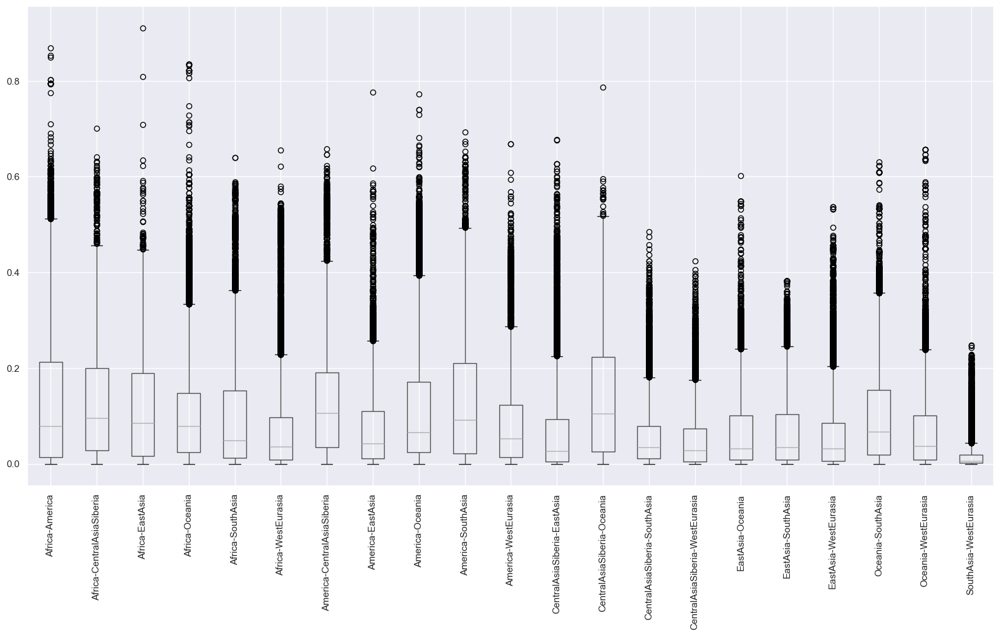

In [150]:
import seaborn as sns
from omniplot import plot as op

boxplot = vst_dt_filtered.iloc[:,3:24].boxplot(figsize=(20,10), rot=90)
#boxplot.set_facecolor('white')

In [58]:
d= vst_dt_filtered[vst_dt_filtered['Chromosome'] == 'chr8']
d= d[d['Start'] > 23390000]
d= d[d['Start'] < 25390000]
d

,Chromosome,Start,End,Africa-America,Africa-CentralAsiaSiberia,Africa-EastAsia,Africa-Oceania,Africa-SouthAsia,Africa-WestEurasia,America-CentralAsiaSiberia,...,CentralAsiaSiberia-EastAsia,CentralAsiaSiberia-Oceania,CentralAsiaSiberia-SouthAsia,CentralAsiaSiberia-WestEurasia,EastAsia-Oceania,EastAsia-SouthAsia,EastAsia-WestEurasia,Oceania-SouthAsia,Oceania-WestEurasia,SouthAsia-WestEurasia
462581,chr8,23392117,23393117,0.00813,0.00983,0.01291,0.16498,0.01188,0.01560,0.00000,...,0.00000,0.19110,0.00000,0.00000,0.22452,0.00000,0.00000,0.21417,0.24838,0.00000
462588,chr8,23410472,23411599,0.00451,0.05411,0.01120,0.11256,0.00669,0.01158,0.02919,...,0.01905,0.22114,0.02753,0.01519,0.15987,0.00070,0.00005,0.15542,0.14423,0.00100
462589,chr8,23411599,23413177,0.02803,0.13414,0.04749,0.11383,0.09193,0.02031,0.05634,...,0.03439,0.36232,0.00997,0.05149,0.24978,0.00956,0.00565,0.31404,0.18725,0.02640
462590,chr8,23413177,23418901,0.04355,0.05226,0.06775,0.22377,0.06262,0.02670,0.00000,...,0.00000,0.41246,0.00000,0.00392,0.46245,0.00000,0.00551,0.44746,0.34304,0.00496
462591,chr8,23418901,23419901,0.01914,0.13328,0.03486,0.16466,0.02639,0.02458,0.08834,...,0.05550,0.47678,0.07042,0.05462,0.31736,0.00064,0.00099,0.30261,0.27391,0.00004
462592,chr8,23419901,23421027,0.07363,0.08780,0.11257,0.18393,0.10443,0.13321,0.00000,...,0.00000,0.42261,0.00000,0.00000,0.47284,0.00000,0.00000,0.45781,0.50587,0.00000
462593,chr8,23421027,23422337,0.00000,0.00000,0.00000,0.18441,0.00000,0.00000,0.00000,...,0.00000,0.16008,0.00000,0.00000,0.18934,0.00000,0.00000,0.18024,0.21047,0.00000
462594,chr8,23422337,23424961,0.03619,0.09264,0.02462,0.02844,0.10723,0.03714,0.01524,...,0.02660,0.23540,0.00009,0.01335,0.10085,0.03248,0.00150,0.24719,0.11071,0.01773
462595,chr8,23424961,23435696,0.06323,0.07557,0.06521,0.10771,0.09011,0.08585,0.00000,...,0.00845,0.33110,0.00000,0.00392,0.32031,0.01030,0.00093,0.36348,0.35757,0.00496
462596,chr8,23435696,23437099,0.05718,0.06842,0.04494,0.18393,0.08170,0.06522,0.00000,...,0.01714,0.50311,0.00000,0.00792,0.44090,0.02085,0.00189,0.53875,0.48576,0.01000


<h1> Deletions 

In [59]:
cnv_passed_vst = cnvs.T.iloc[filtering_vst.index]
cnv_passed_vst

Sample,LP6005441-DNA_A03,LP6005441-DNA_A04,LP6005441-DNA_A05,LP6005441-DNA_A06,LP6005441-DNA_A08,LP6005441-DNA_A09,LP6005441-DNA_A10,LP6005441-DNA_A11,LP6005441-DNA_A12,LP6005441-DNA_B01,...,LP6005677-DNA_D03,LP6005677-DNA_E01,LP6005677-DNA_F01,LP6005677-DNA_G01,LP6007068-DNA_A01,LP6007069-DNA_A01,SS6004471,SS6004477,SS6004478,SS6004480
0,4.0,3.0,4.0,4.0,4.0,4.0,2.0,4.0,4.0,4.0,...,4.0,4.0,4.0,4.0,4.0,4.0,3.0,2.0,3.0,4.0
1,4.0,3.0,4.0,4.0,4.0,4.0,3.0,4.0,4.0,4.0,...,4.0,4.0,4.0,4.0,3.0,4.0,4.0,3.0,3.0,4.0
21,12.0,12.0,12.0,11.0,11.0,11.0,13.0,10.0,11.0,11.0,...,10.0,11.0,11.0,12.0,11.0,11.0,10.0,10.0,11.0,12.0
28,10.0,10.0,10.0,10.0,9.0,9.0,10.0,10.0,9.0,10.0,...,10.0,9.0,9.0,10.0,9.0,10.0,11.0,10.0,9.0,11.0
29,15.0,14.0,16.0,15.0,13.0,13.0,15.0,15.0,14.0,14.0,...,14.0,13.0,13.0,17.0,13.0,16.0,17.0,16.0,14.0,17.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
918297,3.0,2.0,2.0,2.0,2.0,2.0,2.0,2.0,2.0,2.0,...,2.0,2.0,3.0,3.0,2.0,2.0,2.0,2.0,2.0,2.0
918998,2.0,1.0,2.0,2.0,2.0,2.0,2.0,2.0,2.0,2.0,...,2.0,2.0,2.0,2.0,2.0,2.0,2.0,2.0,1.0,1.0
919225,4.0,3.0,3.0,3.0,5.0,3.0,3.0,4.0,3.0,3.0,...,5.0,3.0,3.0,5.0,5.0,4.0,3.0,3.0,3.0,4.0
919226,3.0,2.0,3.0,2.0,3.0,2.0,2.0,3.0,2.0,3.0,...,3.0,2.0,2.0,4.0,3.0,2.0,2.0,2.0,2.0,3.0


In [60]:
cnvs

,0,1,2,3,4,5,6,7,8,9,...,920281,920282,920283,920284,920285,920286,920287,920288,920289,920290
Sample,,,,,,,,,,,,,,,,,,,,,
LP6005441-DNA_A03,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,...,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0
LP6005441-DNA_A04,3.0,3.0,3.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,...,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0
LP6005441-DNA_A05,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,...,4.0,4.0,4.0,4.0,3.0,4.0,4.0,4.0,4.0,4.0
LP6005441-DNA_A06,4.0,4.0,4.0,4.0,3.0,3.0,4.0,4.0,4.0,4.0,...,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0
LP6005441-DNA_A08,4.0,4.0,4.0,4.0,3.0,4.0,4.0,4.0,4.0,5.0,...,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
LP6007069-DNA_A01,4.0,4.0,3.0,4.0,4.0,4.0,4.0,3.0,4.0,4.0,...,4.0,4.0,4.0,4.0,4.0,5.0,4.0,5.0,4.0,5.0
SS6004471,3.0,4.0,3.0,4.0,3.0,4.0,3.0,4.0,4.0,4.0,...,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,5.0
SS6004477,2.0,3.0,4.0,4.0,4.0,4.0,4.0,3.0,4.0,4.0,...,4.0,4.0,4.0,4.0,4.0,5.0,4.0,4.0,4.0,5.0


In [61]:
cnv_passed_vst = cnv_passed_vst[(cnv_passed_vst[cnv_passed_vst.columns[1:]]<3).all(axis=1)]
counts = cnv_passed_vst.T
counts = counts.sort_index()
counts

,201,513,1517,2645,2656,2657,2658,2677,3127,3128,...,915277,915935,916110,916113,917261,917480,917634,917682,918011,918998
Sample,,,,,,,,,,,,,,,,,,,,,
LP6005441-DNA_A03,2.0,1.0,2.0,2.0,2.0,2.0,2.0,2.0,2.0,2.0,...,1.0,1.0,2.0,1.0,2.0,2.0,2.0,1.0,2.0,2.0
LP6005441-DNA_A04,2.0,2.0,2.0,2.0,2.0,2.0,2.0,2.0,2.0,2.0,...,2.0,2.0,2.0,2.0,2.0,1.0,2.0,2.0,2.0,1.0
LP6005441-DNA_A05,2.0,1.0,2.0,2.0,2.0,2.0,2.0,1.0,2.0,2.0,...,2.0,1.0,2.0,2.0,2.0,2.0,2.0,2.0,2.0,2.0
LP6005441-DNA_A06,2.0,2.0,2.0,2.0,2.0,2.0,2.0,1.0,2.0,2.0,...,2.0,1.0,2.0,2.0,2.0,2.0,2.0,1.0,2.0,2.0
LP6005441-DNA_A08,2.0,2.0,2.0,2.0,2.0,2.0,1.0,2.0,2.0,2.0,...,2.0,1.0,1.0,1.0,2.0,2.0,2.0,2.0,1.0,2.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
LP6007069-DNA_A01,2.0,1.0,2.0,2.0,2.0,2.0,2.0,2.0,2.0,2.0,...,2.0,1.0,1.0,2.0,2.0,2.0,2.0,2.0,1.0,2.0
SS6004471,2.0,1.0,1.0,2.0,2.0,2.0,2.0,2.0,2.0,2.0,...,2.0,2.0,2.0,2.0,2.0,2.0,2.0,2.0,1.0,2.0
SS6004477,2.0,1.0,2.0,2.0,2.0,2.0,2.0,2.0,2.0,2.0,...,1.0,1.0,2.0,2.0,1.0,2.0,2.0,2.0,1.0,2.0


In [62]:
#PCA

x = StandardScaler().fit_transform(counts)
pca = PCA(n_components=10)
pca_results = pca.fit_transform(x)

df_pca= pd.DataFrame(pca_results,
                          columns=['component_1','component_2', 'component_3', 'component_4',
                                  'component_5',
                                  'component_6',
                                  'component_7',
                                  'component_8',
                                  'component_9',
                                   'component_10'
                                  ],
                          index=features.index)




df_pca = features.merge(df_pca, left_index=True, right_index=True)
pca.explained_variance_ratio_

array([0.08663774, 0.04371019, 0.03711978, 0.02440873, 0.02139347,
       0.01804271, 0.0176655 , 0.01446065, 0.01372473, 0.01076873])

             component_1  component_2  component_3  component_4  component_5  \
Region                                                                         
Oceania        -6.848968   -13.073737    -9.004159     0.203383     9.503410   
America        -6.550349    -7.713769    10.104456     5.099238     1.473735   
WestEurasia    -5.881603     5.944373     5.286269    -2.737777    -4.373123   
WestEurasia    -9.403654     7.938358     4.986637    -1.702157    -2.301053   
Africa         -1.274130     9.804658   -14.273202     1.302848     1.847233   
...                  ...          ...          ...          ...          ...   
WestEurasia    17.234617     5.948863     3.887715    -8.324563     5.955684   
Africa         -4.360506     3.064692   -16.127359     6.467491     7.888962   
Oceania         1.750321   -12.294697   -13.183753    -3.752692    16.190959   
Oceania        -0.339520   -18.230197    -9.010195    -3.857978    18.150049   
Africa          0.459526    12.292587   

/Users/luciabazan/Documents/GitHub/cnv_sgdp/scripts/pca_plot.py:85: FutureWarning: Creating a Groupby object with a length-1 list-like level parameter will yield indexes as tuples in a future version. To keep indexes as scalars, create Groupby objects with a scalar level parameter instead.
  for name, group in groups:
/Users/luciabazan/Documents/GitHub/cnv_sgdp/scripts/pca_plot.py:102: FutureWarning: Creating a Groupby object with a length-1 list-like level parameter will yield indexes as tuples in a future version. To keep indexes as scalars, create Groupby objects with a scalar level parameter instead.
  for name, group in groups:
/Users/luciabazan/Documents/GitHub/cnv_sgdp/scripts/pca_plot.py:85: FutureWarning: Creating a Groupby object with a length-1 list-like level parameter will yield indexes as tuples in a future version. To keep indexes as scalars, create Groupby objects with a scalar level parameter instead.
  for name, group in groups:
/Users/luciabazan/Documents/GitHub/cnv_

Count of groups by factor: 7
             component_1  component_2  component_3  component_4  component_5  \
Region                                                                         
Oceania        -6.848968   -13.073737    -9.004159     0.203383     9.503410   
America        -6.550349    -7.713769    10.104456     5.099238     1.473735   
WestEurasia    -5.881603     5.944373     5.286269    -2.737777    -4.373123   
WestEurasia    -9.403654     7.938358     4.986637    -1.702157    -2.301053   
Africa         -1.274130     9.804658   -14.273202     1.302848     1.847233   
...                  ...          ...          ...          ...          ...   
WestEurasia    17.234617     5.948863     3.887715    -8.324563     5.955684   
Africa         -4.360506     3.064692   -16.127359     6.467491     7.888962   
Oceania         1.750321   -12.294697   -13.183753    -3.752692    16.190959   
Oceania        -0.339520   -18.230197    -9.010195    -3.857978    18.150049   
Africa     

/Users/luciabazan/Documents/GitHub/cnv_sgdp/scripts/pca_plot.py:102: FutureWarning: Creating a Groupby object with a length-1 list-like level parameter will yield indexes as tuples in a future version. To keep indexes as scalars, create Groupby objects with a scalar level parameter instead.
  for name, group in groups:
/Users/luciabazan/Documents/GitHub/cnv_sgdp/scripts/pca_plot.py:85: FutureWarning: Creating a Groupby object with a length-1 list-like level parameter will yield indexes as tuples in a future version. To keep indexes as scalars, create Groupby objects with a scalar level parameter instead.
  for name, group in groups:
/Users/luciabazan/Documents/GitHub/cnv_sgdp/scripts/pca_plot.py:102: FutureWarning: Creating a Groupby object with a length-1 list-like level parameter will yield indexes as tuples in a future version. To keep indexes as scalars, create Groupby objects with a scalar level parameter instead.
  for name, group in groups:
/Users/luciabazan/Documents/GitHub/cnv

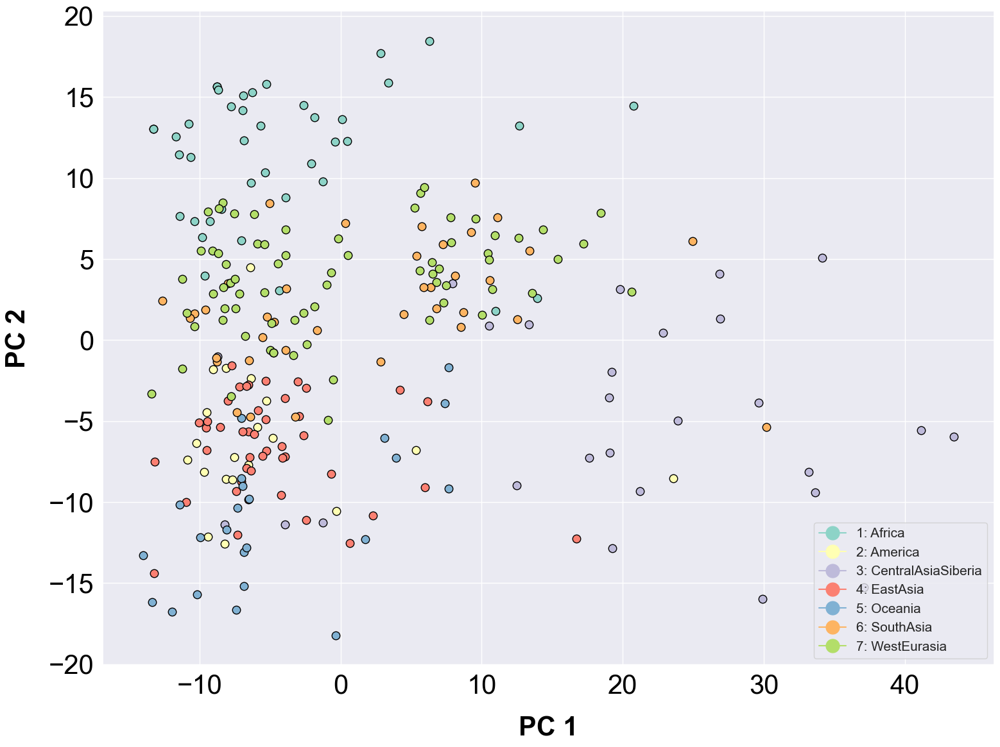

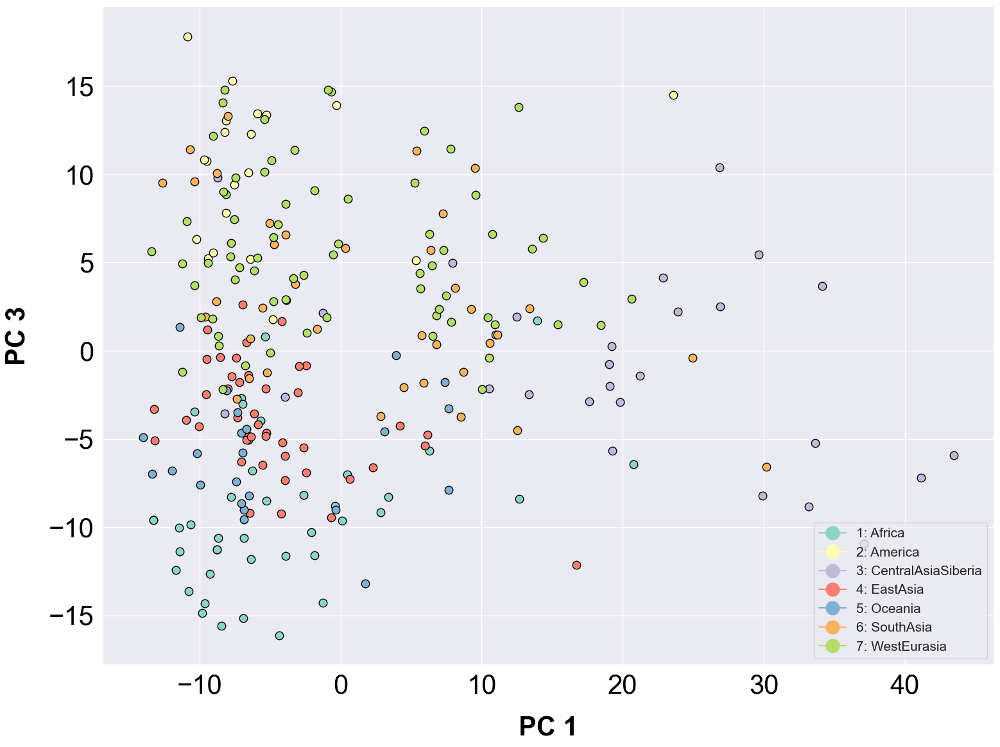

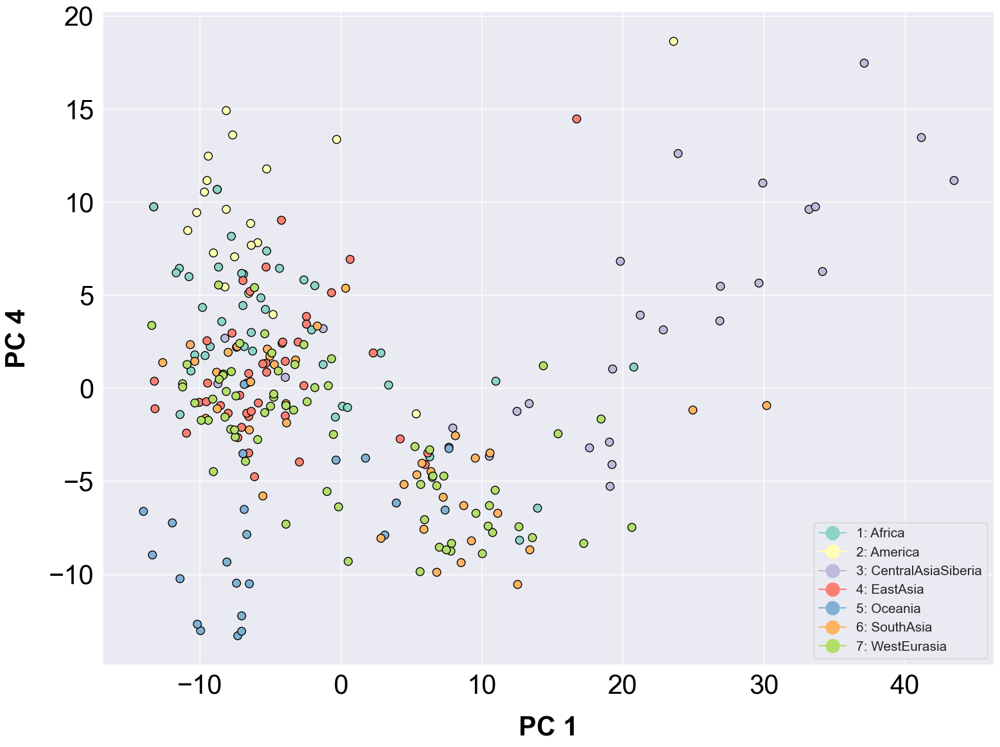

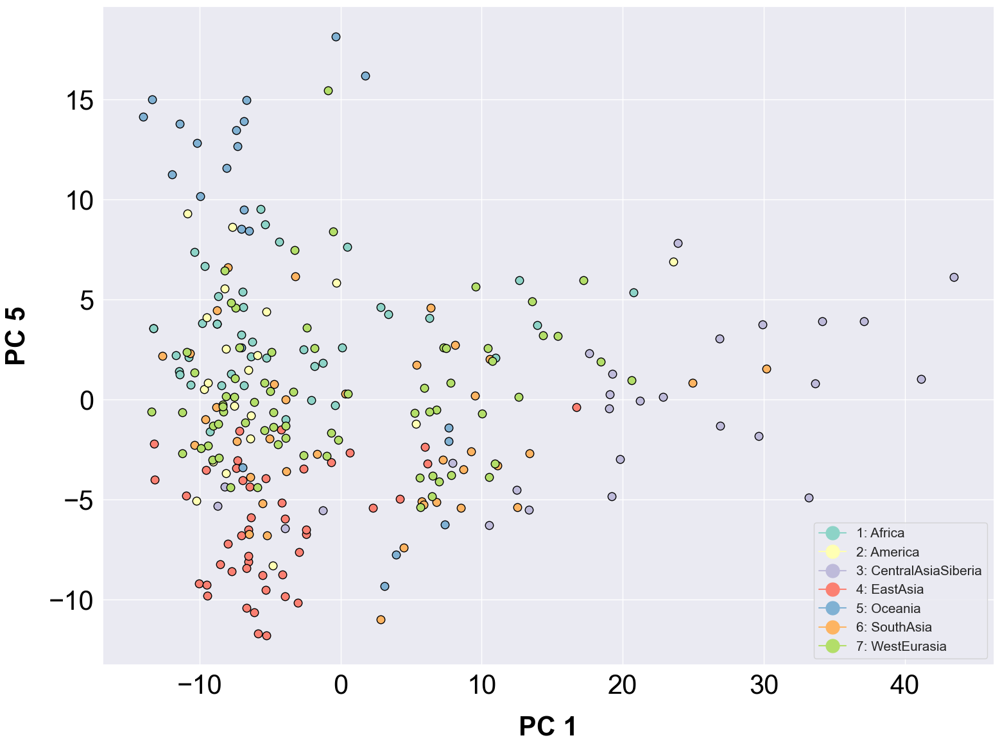

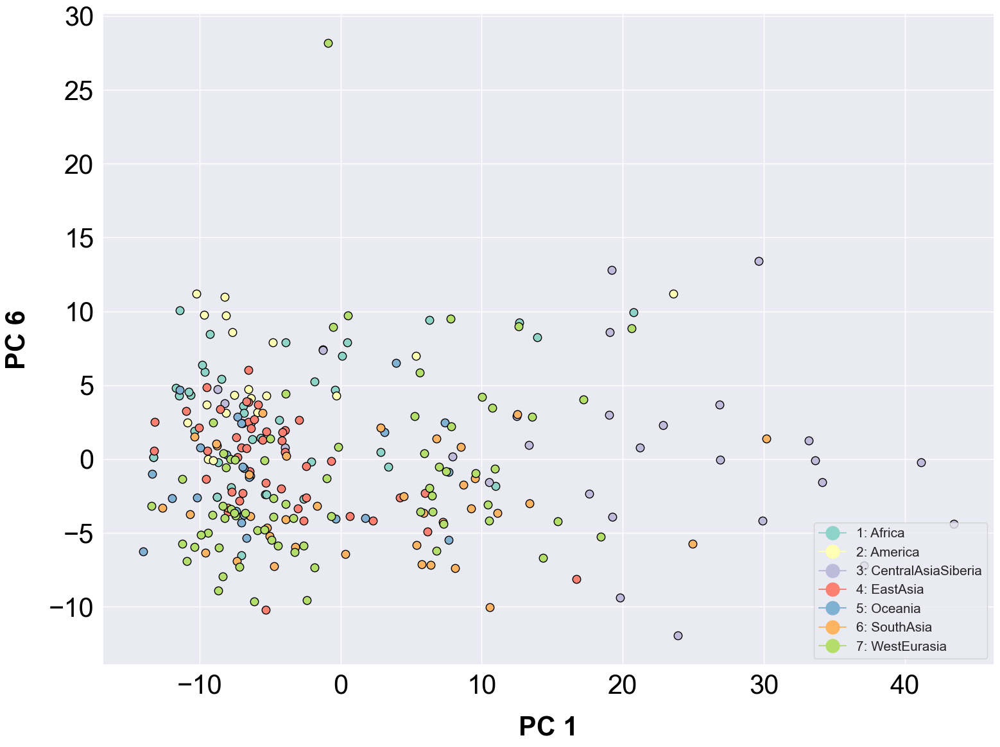

...

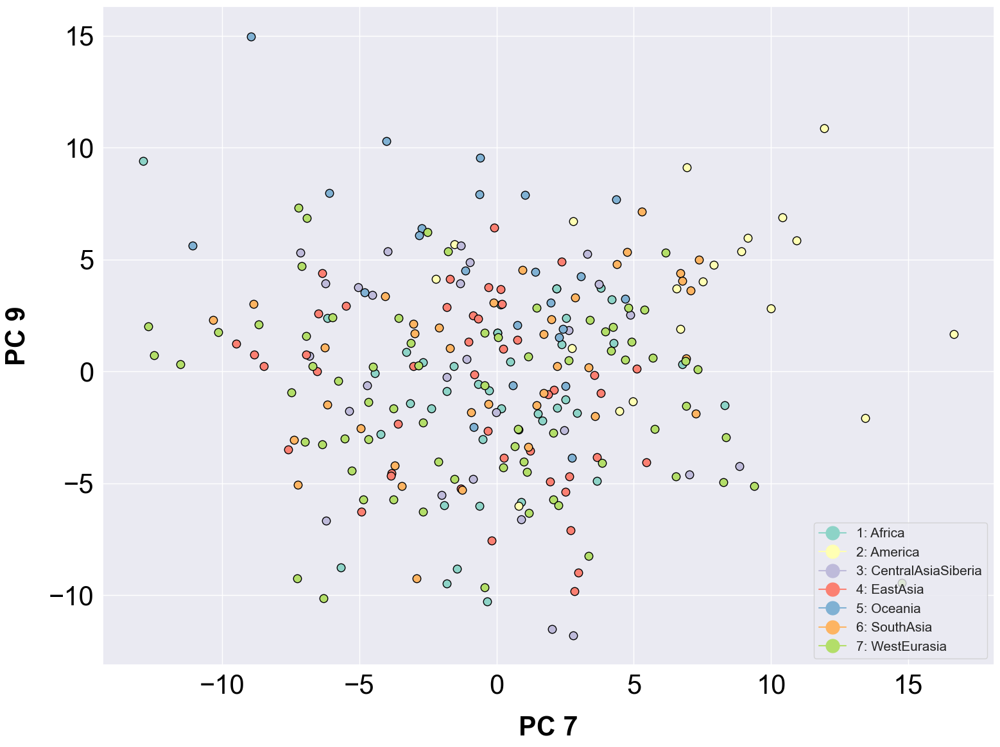

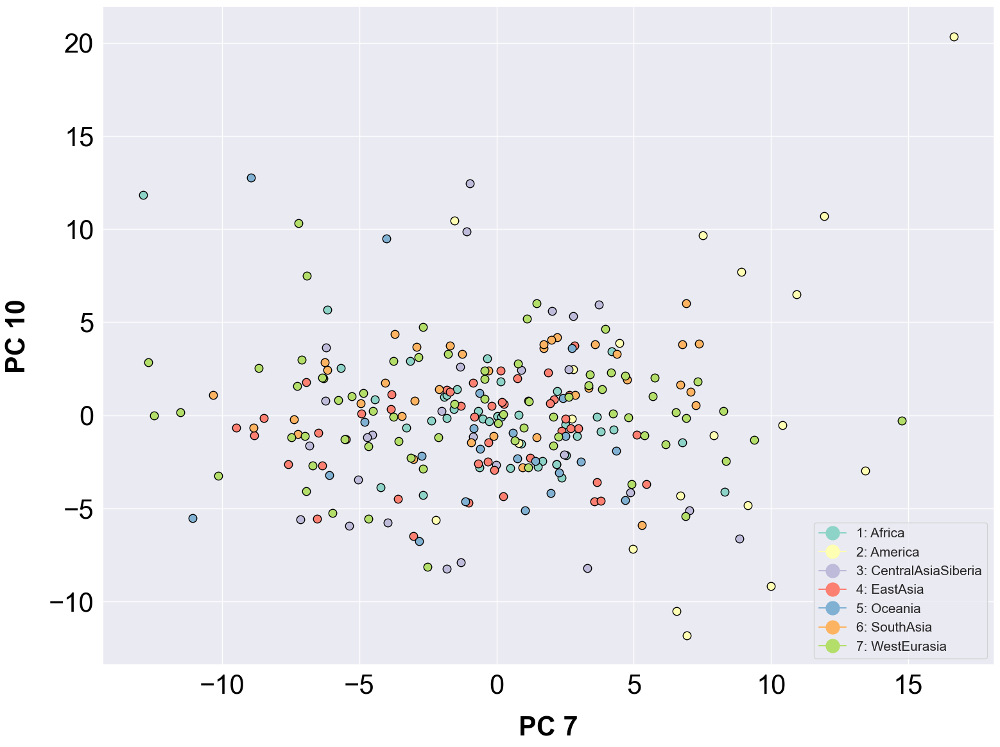

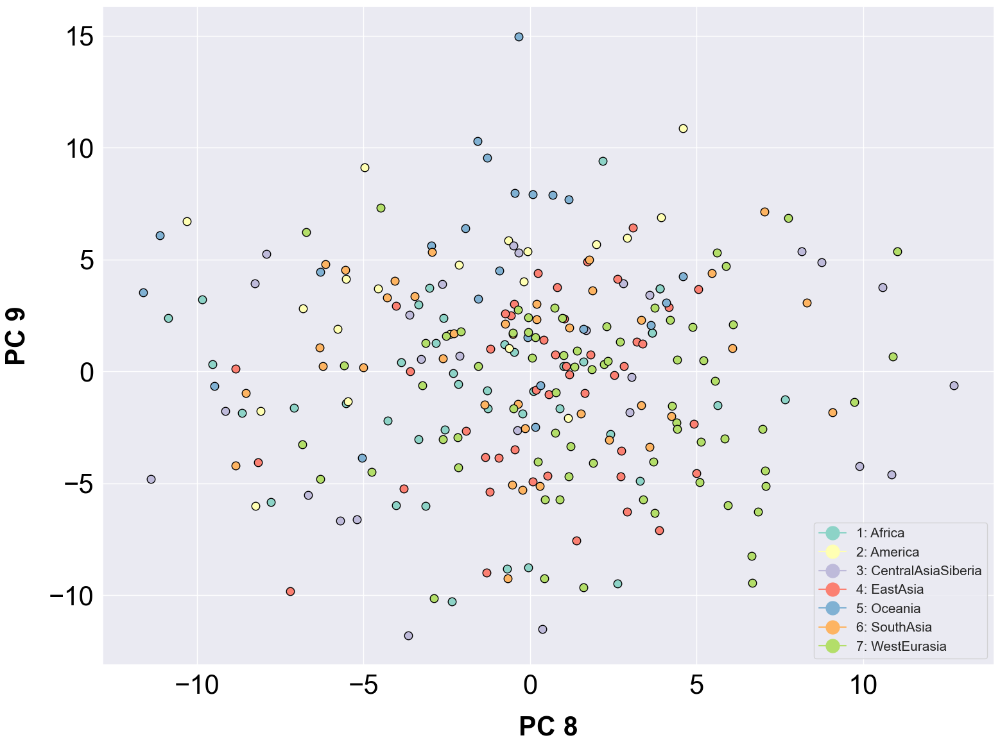

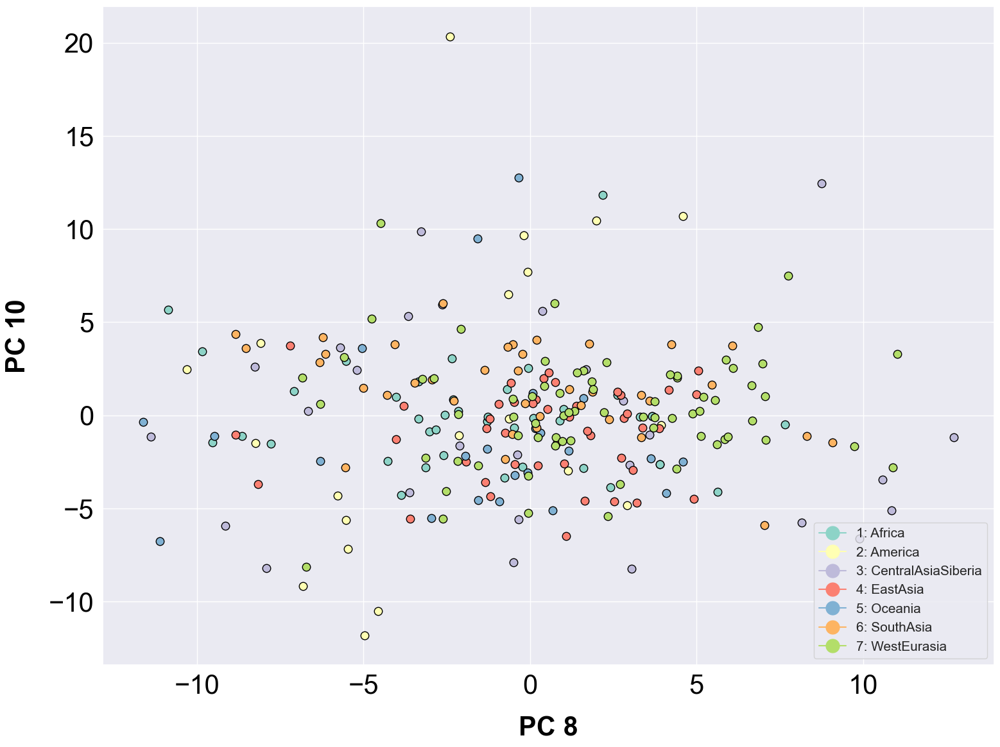

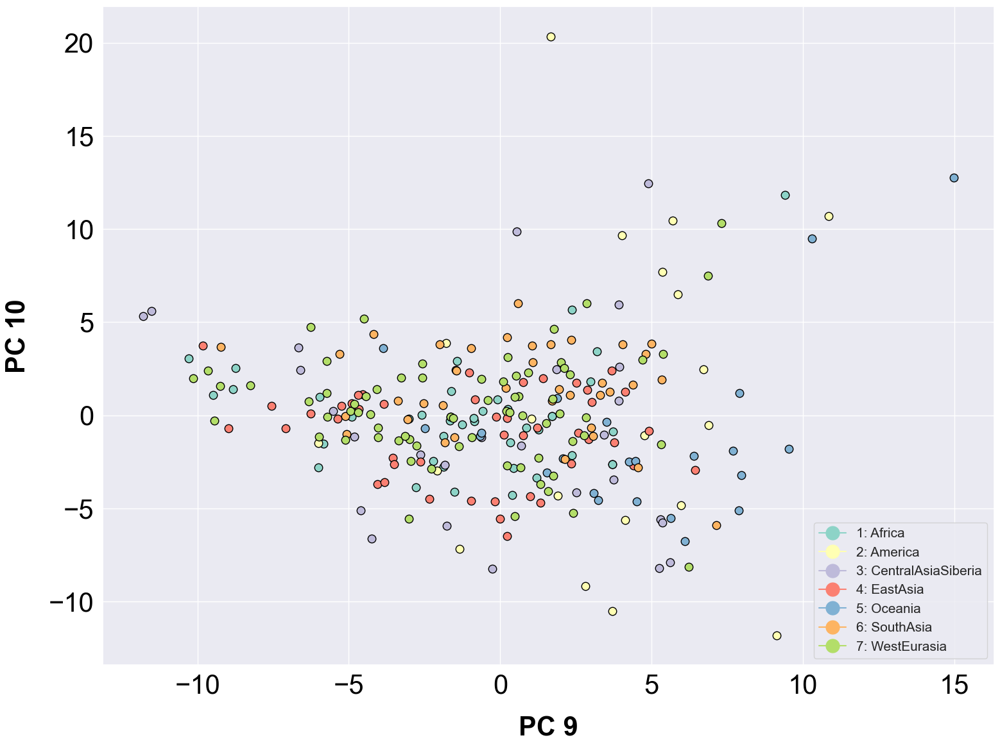

In [63]:
components = [1,2,3,4,5,6,7,8,9,10]

combinations_components = list(combinations(components,2))
for i in combinations_components:
    plot_scatter_cluster(data=df_pca, abscissa='component_'+str(i[0]), ordinate='component_'+str(i[1]), label_horizontal='PC '+ str(i[0]), label_vertical='PC '+str(i[1]), factor='Region', fonts=define_font_properties(), colors=define_color_properties(), legend=True)
    #print(str(i[0]))

             component_1  component_2  component_3  component_4  component_5  \
Region                                                                         
Oceania       -12.783223     9.284373    -3.050716    -3.912634     6.127503   
America        -0.927015     5.768115     9.157284    -2.026119    -0.811232   
WestEurasia     0.672956    -6.237709     1.249429    -3.070704    -7.943804   
WestEurasia    -0.397026    -8.297088     1.323109    -2.959827    -6.246383   
Africa         -3.458200    -7.396104   -11.276153     3.244115     7.523416   
...                  ...          ...          ...          ...          ...   
WestEurasia    15.859837    -1.035799    -1.926714     2.538892     3.229084   
Africa         -8.505712    -6.730796    -8.461202     4.341436     3.873774   
Oceania        -6.477045     6.822746    -5.962989    -1.056893     5.988514   
Oceania        -9.164231    13.115796    -0.994964    -6.281818     6.149394   
Africa          2.876817   -10.457546   

/Users/luciabazan/Documents/GitHub/cnv_sgdp/scripts/pca_plot.py:85: FutureWarning: Creating a Groupby object with a length-1 list-like level parameter will yield indexes as tuples in a future version. To keep indexes as scalars, create Groupby objects with a scalar level parameter instead.
  for name, group in groups:
/Users/luciabazan/Documents/GitHub/cnv_sgdp/scripts/pca_plot.py:102: FutureWarning: Creating a Groupby object with a length-1 list-like level parameter will yield indexes as tuples in a future version. To keep indexes as scalars, create Groupby objects with a scalar level parameter instead.
  for name, group in groups:


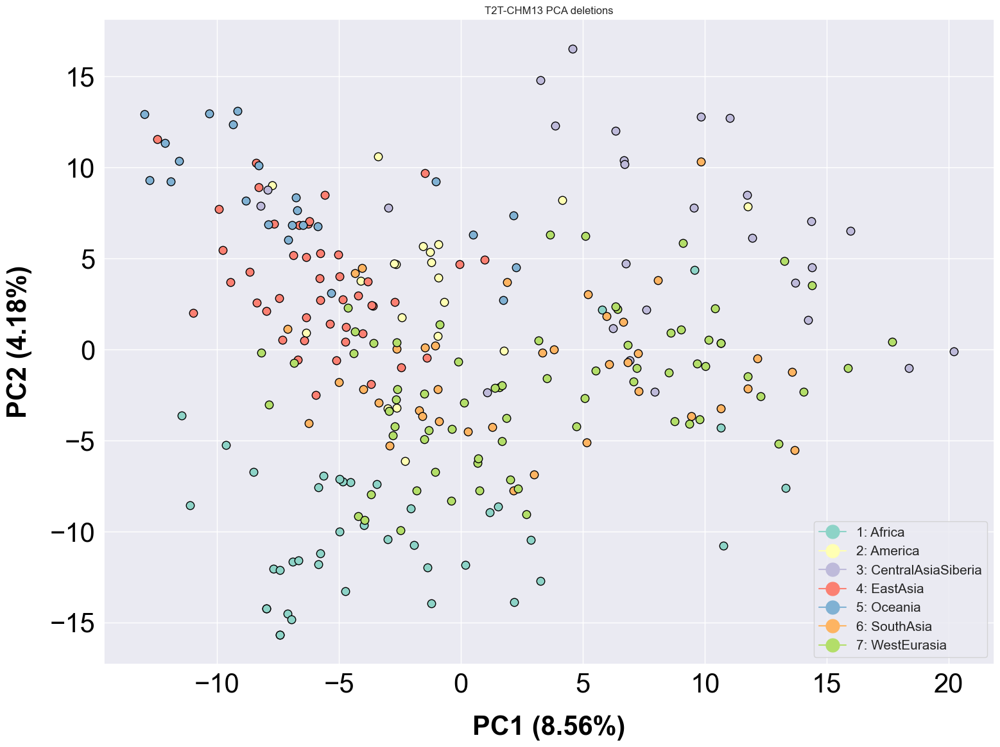

In [101]:
plot_scatter_cluster(data=df_pca, abscissa='component_1', ordinate='component_2', label_horizontal='PC1 (8.56%)', label_vertical='PC2 (4.18%)', factor='Region', fonts=define_font_properties(), colors=define_color_properties(), legend=True)
plt.title("T2T-CHM13 PCA deletions")

plt.savefig('../plots/t2t_chm13_pca_deletions_pc12.png', transparent=True)

             component_1  component_2  component_3  component_4  component_5  \
Region                                                                         
Oceania       -12.783223     9.284373    -3.050716    -3.912634     6.127503   
America        -0.927015     5.768115     9.157284    -2.026119    -0.811232   
WestEurasia     0.672956    -6.237709     1.249429    -3.070704    -7.943804   
WestEurasia    -0.397026    -8.297088     1.323109    -2.959827    -6.246383   
Africa         -3.458200    -7.396104   -11.276153     3.244115     7.523416   
...                  ...          ...          ...          ...          ...   
WestEurasia    15.859837    -1.035799    -1.926714     2.538892     3.229084   
Africa         -8.505712    -6.730796    -8.461202     4.341436     3.873774   
Oceania        -6.477045     6.822746    -5.962989    -1.056893     5.988514   
Oceania        -9.164231    13.115796    -0.994964    -6.281818     6.149394   
Africa          2.876817   -10.457546   

/Users/luciabazan/Documents/GitHub/cnv_sgdp/scripts/pca_plot.py:85: FutureWarning: Creating a Groupby object with a length-1 list-like level parameter will yield indexes as tuples in a future version. To keep indexes as scalars, create Groupby objects with a scalar level parameter instead.
  for name, group in groups:
/Users/luciabazan/Documents/GitHub/cnv_sgdp/scripts/pca_plot.py:102: FutureWarning: Creating a Groupby object with a length-1 list-like level parameter will yield indexes as tuples in a future version. To keep indexes as scalars, create Groupby objects with a scalar level parameter instead.
  for name, group in groups:


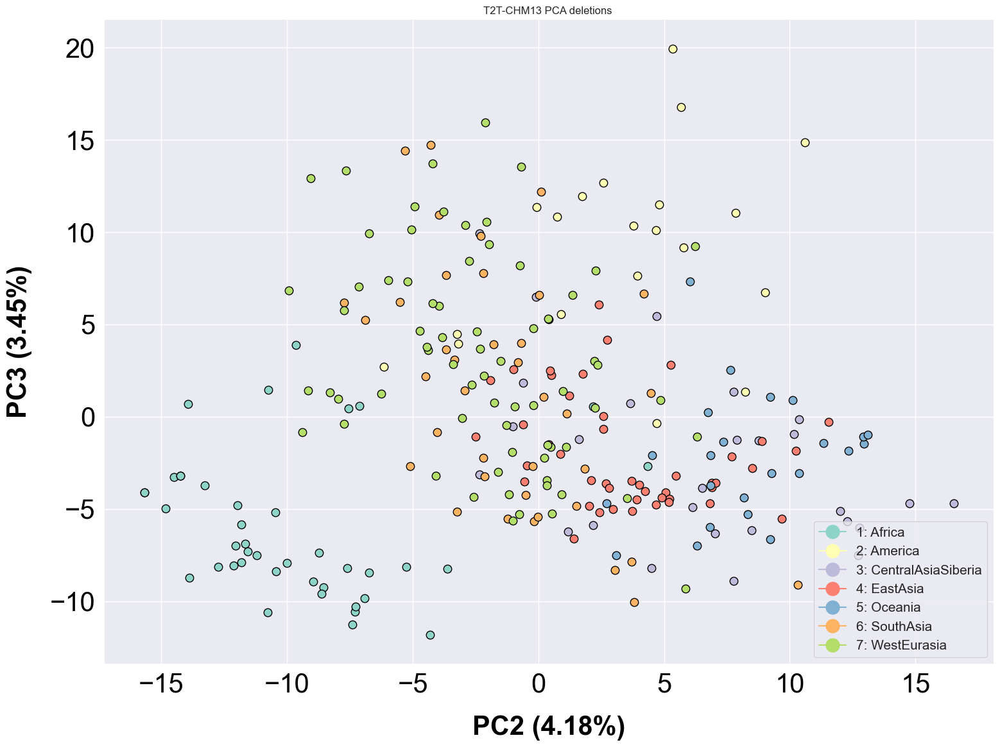

In [102]:
plot_scatter_cluster(data=df_pca, abscissa='component_2', ordinate='component_3', label_horizontal='PC2 (4.18%)', label_vertical='PC3 (3.45%)', factor='Region', fonts=define_font_properties(), colors=define_color_properties(), legend=True)
plt.title("T2T-CHM13 PCA deletions ")

plt.savefig('../plots/t2t_chm13_pca_deletions_pc23.png', transparent=True)

             component_1  component_2  component_3  component_4  component_5  \
Region                                                                         
Oceania       -12.783223     9.284373    -3.050716    -3.912634     6.127503   
America        -0.927015     5.768115     9.157284    -2.026119    -0.811232   
WestEurasia     0.672956    -6.237709     1.249429    -3.070704    -7.943804   
WestEurasia    -0.397026    -8.297088     1.323109    -2.959827    -6.246383   
Africa         -3.458200    -7.396104   -11.276153     3.244115     7.523416   
...                  ...          ...          ...          ...          ...   
WestEurasia    15.859837    -1.035799    -1.926714     2.538892     3.229084   
Africa         -8.505712    -6.730796    -8.461202     4.341436     3.873774   
Oceania        -6.477045     6.822746    -5.962989    -1.056893     5.988514   
Oceania        -9.164231    13.115796    -0.994964    -6.281818     6.149394   
Africa          2.876817   -10.457546   

/Users/luciabazan/Documents/GitHub/cnv_sgdp/scripts/pca_plot.py:85: FutureWarning: Creating a Groupby object with a length-1 list-like level parameter will yield indexes as tuples in a future version. To keep indexes as scalars, create Groupby objects with a scalar level parameter instead.
  for name, group in groups:
/Users/luciabazan/Documents/GitHub/cnv_sgdp/scripts/pca_plot.py:102: FutureWarning: Creating a Groupby object with a length-1 list-like level parameter will yield indexes as tuples in a future version. To keep indexes as scalars, create Groupby objects with a scalar level parameter instead.
  for name, group in groups:


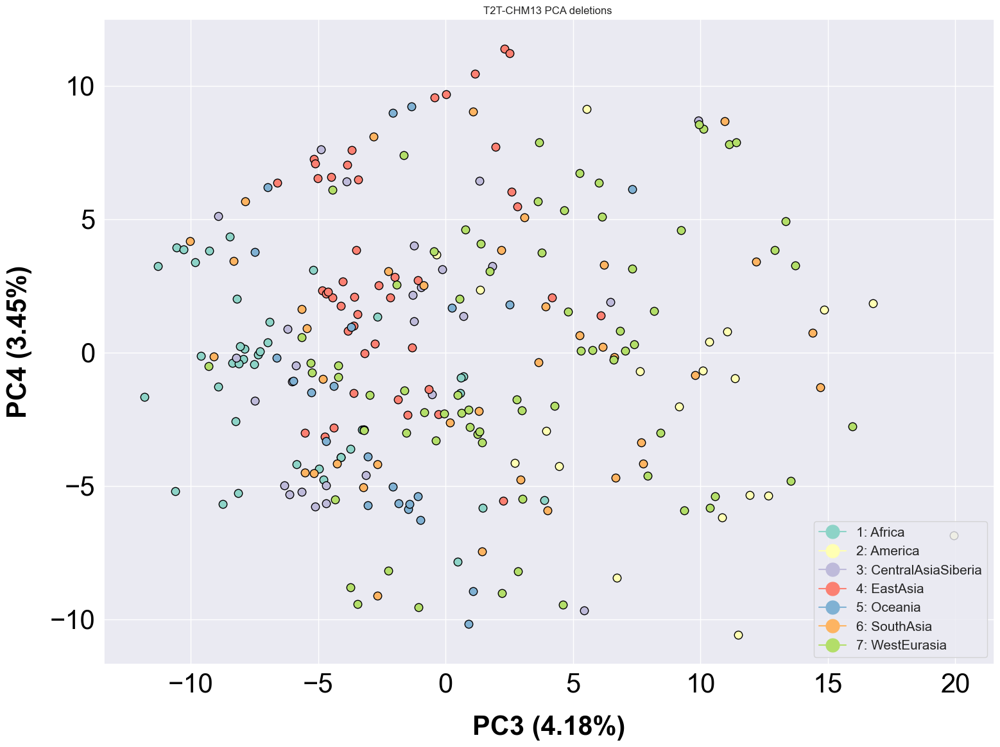

In [103]:
plot_scatter_cluster(data=df_pca, abscissa='component_3', ordinate='component_4', label_horizontal='PC3 (4.18%)', label_vertical='PC4 (3.45%)', factor='Region', fonts=define_font_properties(), colors=define_color_properties(), legend=True)
plt.title("T2T-CHM13 PCA deletions ")

plt.savefig('../plots/t2t_chm13_pca_deletions_pc34.png', transparent=True)

<h1> Duplications

In [104]:
cnv_passed_vst = cnvs.T.iloc[filtering_vst.index]
cnv_passed_vst = cnv_passed_vst[(cnv_passed_vst[cnv_passed_vst.columns[1:]]<5).all(axis=1)]
cnv_passed_vst = cnv_passed_vst[(cnv_passed_vst[cnv_passed_vst.columns[1:]]>1).all(axis=1)]
counts = cnv_passed_vst.T
counts = counts.sort_index()
counts

,73,423,8965,33620,39179,41484,66365,71132,75409,94302,...,784546,784551,790730,801071,801082,803233,803375,804296,813724,813746
Sample,,,,,,,,,,,,,,,,,,,,,
LP6005441-DNA_A03,2.0,2.0,2.0,2.0,4.0,3.0,2.0,3.0,3.0,2.0,...,2.0,3.0,3.0,3.0,3.0,3.0,3.0,2.0,3.0,4.0
LP6005441-DNA_A04,3.0,3.0,2.0,2.0,4.0,3.0,3.0,2.0,3.0,3.0,...,3.0,3.0,3.0,3.0,2.0,4.0,3.0,2.0,3.0,4.0
LP6005441-DNA_A05,3.0,2.0,2.0,2.0,4.0,3.0,3.0,3.0,2.0,3.0,...,2.0,3.0,3.0,3.0,3.0,3.0,3.0,3.0,3.0,4.0
LP6005441-DNA_A06,3.0,3.0,3.0,4.0,4.0,3.0,3.0,2.0,2.0,3.0,...,2.0,3.0,4.0,3.0,3.0,3.0,3.0,3.0,4.0,4.0
LP6005441-DNA_A08,2.0,3.0,2.0,4.0,3.0,3.0,2.0,3.0,2.0,3.0,...,3.0,3.0,3.0,4.0,3.0,4.0,2.0,3.0,3.0,4.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
LP6007069-DNA_A01,3.0,2.0,2.0,3.0,3.0,3.0,3.0,2.0,2.0,3.0,...,3.0,4.0,4.0,3.0,2.0,3.0,2.0,2.0,4.0,4.0
SS6004471,3.0,3.0,3.0,4.0,4.0,3.0,3.0,2.0,3.0,3.0,...,2.0,3.0,3.0,4.0,2.0,4.0,2.0,2.0,4.0,4.0
SS6004477,3.0,3.0,3.0,3.0,3.0,3.0,3.0,2.0,2.0,3.0,...,3.0,4.0,4.0,4.0,2.0,3.0,3.0,2.0,4.0,4.0


In [105]:
#PCA

x = StandardScaler().fit_transform(counts)
pca = PCA(n_components=10)
pca_results = pca.fit_transform(x)

df_pca= pd.DataFrame(pca_results,
                          columns=['component_1','component_2', 'component_3', 'component_4',
                                  'component_5',
                                  'component_6',
                                  'component_7',
                                  'component_8',
                                  'component_9',
                                   'component_10'
                                  ],
                          index=features.index)




df_pca = features.merge(df_pca, left_index=True, right_index=True)
pca.explained_variance_ratio_

array([0.12114271, 0.06881838, 0.04048381, 0.02810997, 0.02645486,
       0.02245749, 0.01860023, 0.01669285, 0.01611969, 0.015448  ])

In [1]:
components = [1,2,3,4,5,6,7,8,9,10]

combinations_components = list(combinations(components,2))
for i in combinations_components:
    plot_scatter_cluster(data=df_pca, abscissa='component_'+str(i[0]), ordinate='component_'+str(i[1]), label_horizontal='PC '+ str(i[0]), label_vertical='PC '+str(i[1]), factor='Region', fonts=define_font_properties(), colors=define_color_properties(), legend=True)
    #print(str(i[0]))

NameError: name 'combinations' is not defined

             component_1  component_2  component_3  component_4  component_5  \
Region                                                                         
Oceania        -4.450035     6.815697    -7.421908     1.905746    -0.851500   
America        -3.883392    -3.855497     0.620907    -1.343915     3.236074   
WestEurasia    -1.415519    -2.461159     0.595051     0.434715    -0.190463   
WestEurasia    -5.872439     3.348775     4.843515    -1.759273    -0.710254   
Africa         -0.487722    -2.371804    -0.516584     1.212385    -2.931404   
...                  ...          ...          ...          ...          ...   
WestEurasia     2.577916     1.904521    -2.477368    -0.689603     1.424411   
Africa         -3.923444    -2.780249     0.637060     4.237053    -0.351652   
Oceania        -3.475620     5.257567     4.022381     0.135898    -1.983591   
Oceania        -3.680524     6.708563     1.637725     1.631538    -2.493037   
Africa         -0.597852    -0.161488   

/Users/luciabazan/Documents/GitHub/cnv_sgdp/scripts/pca_plot.py:85: FutureWarning: Creating a Groupby object with a length-1 list-like level parameter will yield indexes as tuples in a future version. To keep indexes as scalars, create Groupby objects with a scalar level parameter instead.
  for name, group in groups:
/Users/luciabazan/Documents/GitHub/cnv_sgdp/scripts/pca_plot.py:102: FutureWarning: Creating a Groupby object with a length-1 list-like level parameter will yield indexes as tuples in a future version. To keep indexes as scalars, create Groupby objects with a scalar level parameter instead.
  for name, group in groups:


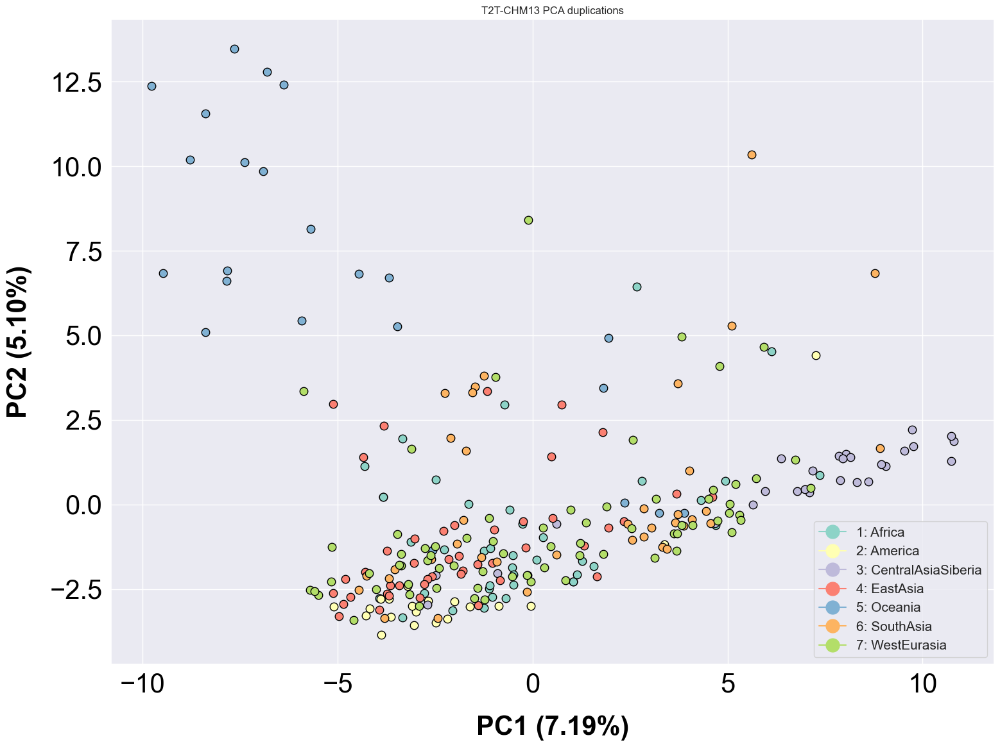

In [107]:
plot_scatter_cluster(data=df_pca, abscissa='component_1', ordinate='component_2', label_horizontal='PC1 (7.19%)', label_vertical='PC2 (5.10%)', factor='Region', fonts=define_font_properties(), colors=define_color_properties(), legend=True)
plt.title("T2T-CHM13 PCA duplications")

plt.savefig('../plots/t2t_chm13_pca_duplications_pc12.png', transparent=True)

             component_1  component_2  component_3  component_4  component_5  \
Region                                                                         
Oceania        -4.450035     6.815697    -7.421908     1.905746    -0.851500   
America        -3.883392    -3.855497     0.620907    -1.343915     3.236074   
WestEurasia    -1.415519    -2.461159     0.595051     0.434715    -0.190463   
WestEurasia    -5.872439     3.348775     4.843515    -1.759273    -0.710254   
Africa         -0.487722    -2.371804    -0.516584     1.212385    -2.931404   
...                  ...          ...          ...          ...          ...   
WestEurasia     2.577916     1.904521    -2.477368    -0.689603     1.424411   
Africa         -3.923444    -2.780249     0.637060     4.237053    -0.351652   
Oceania        -3.475620     5.257567     4.022381     0.135898    -1.983591   
Oceania        -3.680524     6.708563     1.637725     1.631538    -2.493037   
Africa         -0.597852    -0.161488   

/Users/luciabazan/Documents/GitHub/cnv_sgdp/scripts/pca_plot.py:85: FutureWarning: Creating a Groupby object with a length-1 list-like level parameter will yield indexes as tuples in a future version. To keep indexes as scalars, create Groupby objects with a scalar level parameter instead.
  for name, group in groups:
/Users/luciabazan/Documents/GitHub/cnv_sgdp/scripts/pca_plot.py:102: FutureWarning: Creating a Groupby object with a length-1 list-like level parameter will yield indexes as tuples in a future version. To keep indexes as scalars, create Groupby objects with a scalar level parameter instead.
  for name, group in groups:


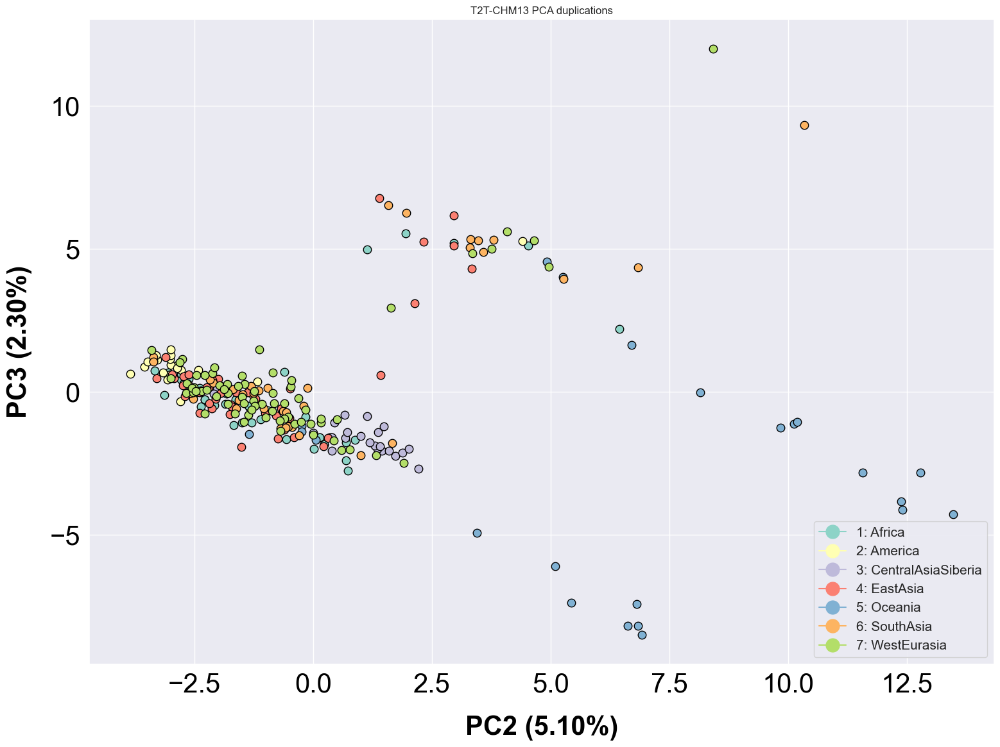

In [108]:
plot_scatter_cluster(data=df_pca, abscissa='component_2', ordinate='component_3', label_horizontal='PC2 (5.10%)', label_vertical='PC3 (2.30%)', factor='Region', fonts=define_font_properties(), colors=define_color_properties(), legend=True)
plt.title("T2T-CHM13 PCA duplications")

plt.savefig('../plots/t2t_chm13_pca_duplications_pc23.png', transparent=True)

In [ ]:
vst_dt_filtered_duplications = vst_dt.iloc[cnv_passed_vst.index]
vst_dt_filtered_duplications.sort_values(by=['WestEurasia-Oceania'], ascending=False).head(50)

<h1> Permutation

In [ ]:
print("Starting permutation")
### Grouping again 
cnvs_passed_vst = cnvs.T.iloc[filtering_vst.T.index]
cnvs_passed_vst = cnvs_passed_vst.T

dt_cnvs_passed_vst = features.merge(cnvs_passed_vst, left_index=True, right_index=True)
dt_cnvs_passed_vst.head()


In [ ]:
cnvs_passed_vst.columns

In [ ]:
####### Groupby regions #######
dt_group = dt_cnvs_passed_vst.groupby('Region')

dt_groupped = []
regions = features['Region'].unique()
for i in regions:
    dt_groupped.append(dt_group.get_group(str(i)))
    

#### Names to pair-population
regions = dt['Region'].unique()
combination_names = []
for i in list(combinations(regions,2)):
    combination_names.append(i[0]+str('-')+i[1])
    
dt_groupped[region[0]]

In [ ]:
p_value_permutation = []

combination_regions = list(combinations([0,1,2,3,4,5,6],2)) 
for region in combination_regions:
    p_value= []
    p_value_permutation.append(p_value)
    
    for i in cnvs_passed_vst.columns:
        permutation = PermutationTest(dt_groupped[region[0]][i], dt_groupped[region[1]][i], stat=vst_function, n_perm=9999)#mean_gt
        p_value.append(permutation.p_value())

In [ ]:
pd.DataFrame(p_value_permutation)

In [ ]:
permutation_pased__vst_chm13 = pd.DataFrame(p_value_permutation).set_axis(combination_names)
# create a process pool that uses all cpus
permutation_pased__vst_chm13.to_csv('../data/permutation_passed_vst_chm13.csv')
permutation_pased__vst_chm13

In [ ]:
permutation_pased__vst_chm13  = pd.read_csv('../data/permutation_passed_vst_chm13.csv', index_col=0)
permutation_pased__vst_chm13 = permutation_pased__vst_chm13.fillna(0)

<h1> Just vst values that passed permutation

In [52]:
vst_dt_filtered = vst_dt.iloc[filtering_vst.T.index]
vst_dt_filtered = vst_dt_filtered.reset_index()
vst_dt_sb = vst_dt_filtered.drop(columns=['chr', 'start','end', 'index'])
vst_dt_sb.describe()

ValueError: invalid literal for int() with base 10: 'Africa-America'

In [ ]:
passed_permut = (permutation_pased__vst_chm13 <0.05)
## Deleting columns where none of the regions passed the imputation
passed_permut =  passed_permut.loc[:, passed_permut.any()]


passed_permut = passed_permut.T
passed_permut = passed_permut.replace(False, np.NaN)
passed_permut = passed_permut.reset_index()
passed_permut = passed_permut.drop(columns=['index'])
passed_permut#.describe()

In [ ]:
passed_permut[passed_permut.notnull()] = vst_dt_sb

In [ ]:
passed_permut

In [ ]:
#sns.set_palette("bright")
for i in passed_permut.columns:
    plt.hist(passed_permut[i], bins=100, alpha=0.2,log=True, color="blue")
    plt.title('T2T-CHM13')

In [ ]:
final_candidates  = pd.DataFrame(passed_permut.T)>=0.2
final_candidates = final_candidates.loc[:, final_candidates.any()]
final_candidates

<h1> Gene regions

In [53]:
## Anotations
t2t_genes = pd.read_csv('../annotation_files/T2T-chm13-catLiftOffGenes.csv')
t2t_genes.columns = ['Chromosome', 'Start', 'End', 'name', 'score', 'strand',
       'thickStart', 'thickEnd', 'reserved', 'blockCount', 'blockSizes',
       'chromStarts', 'name2', 'cdsStartStat', 'cdsEndStat', 'exonFrames',
       'txId', 'type', 'geneName', 'geneType', 'sourceGene',
       'sourceTranscript', 'alignmentId', 'alternativeSourceTranscripts',
       'Paralogy', 'UnfilteredParalogy', 'collapsedGeneIds',
       'collapsedGeneNames', 'frameshift', 'exonAnnotationSupport',
       'intronAnnotationSupport', 'transcriptClass', 'transcriptModes',
       'validStart', 'validStop', 'properOrf', 'extra_paralog']
t2t_genes = t2t_genes[['Chromosome', 'Start', 'End', 'name2']]
t2t_genes = PyRanges(t2t_genes)

vst_dt_filtered_ranges = PyRanges(vst_dt_filtered)
#Genes
grch37_coordinates_genes = vst_dt_filtered_ranges.nearest(t2t_genes)
grch37_coordinates_genes = grch37_coordinates_genes.as_df()
grch37_coordinates_genes = grch37_coordinates_genes[grch37_coordinates_genes['Distance'] <1 ]
grch37_coordinates_genes.to_csv('../data/T2T_genes_differentiated_by_Vst.csv')
grch37_coordinates_genes 


/var/folders/05/4pfxtbrs5459ytz3j1jhcgt00000gn/T/ipykernel_1285/1363149241.py:2: DtypeWarning: Columns (23,36) have mixed types. Specify dtype option on import or set low_memory=False.
  t2t_genes = pd.read_csv('../annotation_files/T2T-chm13-catLiftOffGenes.csv')
/opt/anaconda3/lib/python3.11/site-packages/pyranges/methods/init.py:45: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  return {k: v for k, v in df.groupby(grpby_key)}


NameError: name 'vst_dt_filtered' is not defined

In [65]:
d= grch37_coordinates_genes[grch37_coordinates_genes ['Chromosome'] == 'chr8']
d= d[d['Start'] > 23390000]
d= d[d['Start'] < 25390000]
d

,Chromosome,Start,End,Africa-America,Africa-CentralAsiaSiberia,Africa-EastAsia,Africa-Oceania,Africa-SouthAsia,Africa-WestEurasia,America-CentralAsiaSiberia,...,EastAsia-Oceania,EastAsia-SouthAsia,EastAsia-WestEurasia,Oceania-SouthAsia,Oceania-WestEurasia,SouthAsia-WestEurasia,Start_b,End_b,name2,Distance
4247,chr8,23392117,23393117,0.00813,0.00983,0.01291,0.16498,0.01188,0.01560,0.00000,...,0.22452,0.00000,0.00000,0.21417,0.24838,0.00000,23377858,23392387,TNFRSF10C,0
4248,chr8,23410472,23411599,0.00451,0.05411,0.01120,0.11256,0.00669,0.01158,0.02919,...,0.15987,0.00070,0.00005,0.15542,0.14423,0.00100,23410521,23438957,TNFRSF10D,0
4249,chr8,23411599,23413177,0.02803,0.13414,0.04749,0.11383,0.09193,0.02031,0.05634,...,0.24978,0.00956,0.00565,0.31404,0.18725,0.02640,23410521,23438957,TNFRSF10D,0
4250,chr8,23413177,23418901,0.04355,0.05226,0.06775,0.22377,0.06262,0.02670,0.00000,...,0.46245,0.00000,0.00551,0.44746,0.34304,0.00496,23410521,23438957,TNFRSF10D,0
4251,chr8,23418901,23419901,0.01914,0.13328,0.03486,0.16466,0.02639,0.02458,0.08834,...,0.31736,0.00064,0.00099,0.30261,0.27391,0.00004,23410521,23438957,TNFRSF10D,0
4252,chr8,23419901,23421027,0.07363,0.08780,0.11257,0.18393,0.10443,0.13321,0.00000,...,0.47284,0.00000,0.00000,0.45781,0.50587,0.00000,23410521,23438957,TNFRSF10D,0
4253,chr8,23421027,23422337,0.00000,0.00000,0.00000,0.18441,0.00000,0.00000,0.00000,...,0.18934,0.00000,0.00000,0.18024,0.21047,0.00000,23410521,23438957,TNFRSF10D,0
4254,chr8,23422337,23424961,0.03619,0.09264,0.02462,0.02844,0.10723,0.03714,0.01524,...,0.10085,0.03248,0.00150,0.24719,0.11071,0.01773,23410521,23438957,TNFRSF10D,0
4255,chr8,23424961,23435696,0.06323,0.07557,0.06521,0.10771,0.09011,0.08585,0.00000,...,0.32031,0.01030,0.00093,0.36348,0.35757,0.00496,23410521,23438957,TNFRSF10D,0
4256,chr8,23435696,23437099,0.05718,0.06842,0.04494,0.18393,0.08170,0.06522,0.00000,...,0.44090,0.02085,0.00189,0.53875,0.48576,0.01000,23410521,23438957,TNFRSF10D,0


In [66]:
grch37_coordinates_genes[grch37_coordinates_genes['name2'] == 'KLRC2']

,Chromosome,Start,End,Africa-America,Africa-CentralAsiaSiberia,Africa-EastAsia,Africa-Oceania,Africa-SouthAsia,Africa-WestEurasia,America-CentralAsiaSiberia,...,EastAsia-Oceania,EastAsia-SouthAsia,EastAsia-WestEurasia,Oceania-SouthAsia,Oceania-WestEurasia,SouthAsia-WestEurasia,Start_b,End_b,name2,Distance


In [70]:
Africa_CentralAsiaSiberia = pd.read_table('/Users/luciabazan/Downloads/limma-voom-t2t/limma-voom_Africa-CentralAsiaSiberia.tabular')
Africa_CentralAsiaSiberia['population'] = 'Africa_CentralAsiaSiberia'

Africa_EastAsia = pd.read_table('/Users/luciabazan/Downloads/limma-voom-t2t/limma-voom_Africa-EastAsia.tabular')
Africa_EastAsia['population'] = 'Africa_EastAsia'

Africa_SouthAsia = pd.read_table('/Users/luciabazan/Downloads/limma-voom-t2t/limma-voom_Africa-SouthAsia.tabular')
Africa_SouthAsia['population'] = 'Africa_SouthAsia'

America_SouthAsia = pd.read_table('/Users/luciabazan/Downloads/limma-voom-t2t/limma-voom_America-SouthAsia.tabular')
America_SouthAsia['population'] = 'America_SouthAsia'

America_Africa = pd.read_table('/Users/luciabazan/Downloads/limma-voom-t2t/limma-voom_America-Africa.tabular')
America_Africa['population'] = 'America_Africa'

America_CentralAsiaSiberia = pd.read_table('/Users/luciabazan/Downloads/limma-voom-t2t/limma-voom_America-CentralAsiaSiberia.tabular')
America_CentralAsiaSiberia['population'] = 'America_CentralAsiaSiberia'

America_EastAsia = pd.read_table('/Users/luciabazan/Downloads/limma-voom-t2t/limma-voom_America-EastAsia.tabular')
America_EastAsia['population'] = 'America_EastAsia'
CentralAsiaSiberia_EastAsia = pd.read_table('/Users/luciabazan/Downloads/limma-voom-t2t/limma-voom_CentralAsiaSiberia-EastAsia.tabular')
CentralAsiaSiberia_SouthAsia = pd.read_table('/Users/luciabazan/Downloads/limma-voom-t2t/limma-voom_CentralAsiaSiberia-SouthAsia.tabular')
EastAsia_SouthAsia = pd.read_table('/Users/luciabazan/Downloads/limma-voom-t2t/limma-voom_EastAsia-SouthAsia.tabular')

files = [Africa_CentralAsiaSiberia, Africa_EastAsia, Africa_SouthAsia, America_SouthAsia, America_Africa,America_CentralAsiaSiberia, America_EastAsia]
names = ['Africa_CentralAsiaSiberia', 'Africa_EastAsia', 'Africa_SouthAsia', 'America_SouthAsia', 'America_Africa','America_CentralAsiaSiberia', 'America_EastAsia']

ls = []
for i in files:
    d = i[i['adj.P.Val'] < 0.05]
    ls.append(d)
    

In [71]:
gene_expression = pd.concat(ls, axis=0, ignore_index=True)
gene_expression

,GeneID,logFC,AveExpr,t,P.Value,adj.P.Val,B,population
0,AC051619.4,2.591259,-2.207704,6.799389,1.668827e-08,0.001015,6.364286,Africa_CentralAsiaSiberia
1,AL157813.2,2.418534,-2.439853,6.412220,6.452350e-08,0.001963,5.209765,Africa_CentralAsiaSiberia
2,TBC1D3,-4.811072,0.612627,-5.543541,1.463524e-06,0.029680,2.971252,Africa_CentralAsiaSiberia
3,CYP4F29P,2.762605,-2.882421,5.257473,3.527135e-06,0.039890,2.834078,Africa_CentralAsiaSiberia
4,RNASE4,2.058270,-2.897194,5.253752,3.572245e-06,0.039890,2.603743,Africa_CentralAsiaSiberia
...,...,...,...,...,...,...,...,...
1381,MIR8071-1,5.806598,-0.805839,5.955376,3.859010e-07,0.004696,2.361359,America_EastAsia
1382,SNCAIP,4.249797,-1.420993,5.355356,2.523331e-06,0.022576,0.551758,America_EastAsia
1383,AC093909.4,3.177500,-2.220251,5.346893,2.597578e-06,0.022576,-0.219904,America_EastAsia
1384,MAPK4,2.655419,-3.067479,5.144847,5.177415e-06,0.039374,-0.165475,America_EastAsia


In [72]:
results = grch37_coordinates_genes.merge(gene_expression, right_on='GeneID', left_on='name2')
results.to_csv('../data/degs_vst_t2t.csv')

In [1]:
results

NameError: name 'results' is not defined